Name-Gaurav Pareek
Batch-DSG0223
Subject-Capstone Project Web scrapping phase_1


Phase 1                                                                                                                                            21 marks



Web scrapping the below given  URL :

Rentberry facilitates the long-term home rental process for both tenants and landlords. It help tenants save time on apartment hunting and landlords get the right tenant and rental rates. Rentberry took care of each stage of the leasing process

 Discover all apartments available for long-term rent at reasonable prices

Discover all single-family houses available for long-term rent reasonable prices

We are adding a few more websites from where you can scrap the Rent based data.

Important Note –

·         You have to scrap only Rent properties Data, not for Buy or Sell.

·         You need to scrap minimum of 5000 entries for your dataset. The more is better.

·         The above 5000 entries should consist of at least 10 different cities.

·         Each city should have minimum of 100 entries in the scraped data.

·         The internal/external features will remain same as mentioned in the original document.

·         Wherever the features are not available should be filled out with null values.

·         Imputation of these null values shall be done purely based on your understanding of the data pattern.

·         The target variable should not contain any null values and no imputation should be done in the target variable. If done, this will attract penalties.

·         The area of the property should be strictly in one unit. You can select any one unit of your choice.

·         The price of rent should be strictly in INR (Indian National Rupee). If the rent price is present in any other currency, it should be converted into INR based on the below mentioned conversion criteria:

o   1 USD = 83.12 INR

o   1 Euro = 90.73 INR

o   1 Swiss Franc = 95.73 INR

o   1 Kuwaiti Dinar = 270.04 INR

o   1 Dirham = 22.63 INR

o   For any other currency, use the latest conversion rates into INR.

·         Once the conversion is done on rent price, round off the number to the nearest whole number.

o   Eg. If the rent price is 2405 USD/Month

o   The preice will be converted to INR first.

o   2405 USD = 2405*83.12 INR = 199903.6 INR

o   Now 199903.6 INR should be converted to nearest whole number i.e 199904 INR

o   INR 199904 is the value that should be present in the price feature

In [ ]:
# importing Libraries
from bs4 import BeautifulSoup 
import requests
import pandas as pd

In [4]:
url = "https://rentberry.com/apartments/s/austin-tx"
url

'https://rentberry.com/apartments/s/austin-tx'

In [5]:

headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [6]:

response = requests.get(url, headers=headers)

In [7]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
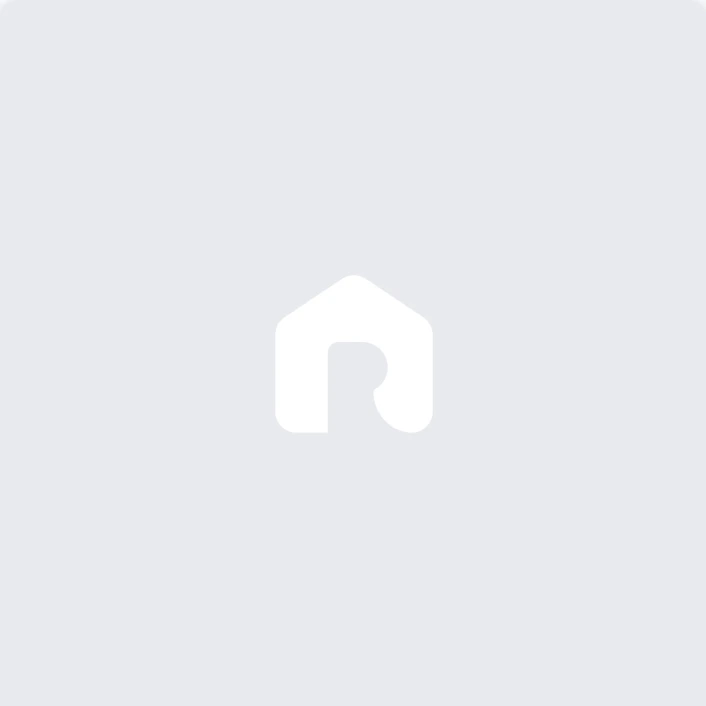

In [8]:
soup = BeautifulSoup(response.content)
soup

In [9]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

In [10]:
# Scrape first 10 pages
for page_num in range(1, 36):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    



In [24]:
len(City),len(State_code),len(Country),len( Deposit),len(Pets_allowed),len(Area),len(no_of_Bathroom),
#len(no_of_Bedroom),len(Address),len(Rental_price),len(Washer_Dryer),len(Air_conditioning),len(Parking),len(Fireplace),
#len(Dishwasher),len(Hardwood_Floors),len(Roofdeck),len(Roofdeck)

(0, 0, 0, 0, 0, 0, 0)

In [11]:
# Create DataFrame
austin_tx = pd.DataFrame({
    'City': City[0:650],
    'State_code':State_code[0:650],
    'Country':Country[0:650],
    'Deposit': Deposit[0:650],
    'Pets_allowed':Pets_allowed[0:650],
    'Area': Area[0:650],
    'no_of_Bathroom': no_of_Bathroom[0:650],
    'no_of_Bedroom': no_of_Bedroom[0:650],
    'Address': Address[0:650],
    'Rental_price': Rental_price[0:650],
    'Washer_Dryer': Washer_Dryer[0:650],
    'Air_conditioning ': Air_conditioning[0:650],
    'Parking': Parking[0:650],
    'Fireplace': Fireplace[0:650],
    'Dishwasher': Dishwasher[0:650],
    'Hardwood_Floors': Hardwood_Floors[0:650],
    'Roofdeck': Roofdeck[0:650],
    'Storage': Storage[0:650]
   
})

# Display DataFrame
print(austin_tx)

                                                  City  \
0                                  801 West 5th Street   
1                                 1000 East 5th Street   
2                               110 San Antonio Street   
3                                  615 West 7th Street   
4                           Austin, Jollyville, TX, US   
..                                                 ...   
645                                         Austin, TX   
646  3869 Royal Troon Drive, Round Rock, TX 78664, USA   
647          10901 Legends Lane, Austin, TX 78747, USA   
648                                         Austin, TX   
649                             110 San Antonio Street   

                                            State_code  \
0                                  801 West 5th Street   
1                                 1000 East 5th Street   
2                               110 San Antonio Street   
3                                  615 West 7th Street   
4            

In [12]:
austin_tx.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,801 West 5th Street,801 West 5th Street,801 West 5th Street,"$3,380",No,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No
1,1000 East 5th Street,1000 East 5th Street,1000 East 5th Street,"$2,012",No,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No
2,110 San Antonio Street,110 San Antonio Street,110 San Antonio Street,"$3,754",No,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No
3,615 West 7th Street,615 West 7th Street,615 West 7th Street,"$3,922",No,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No
4,"Austin, Jollyville, TX, US","Austin, Jollyville, TX, US","Austin, Jollyville, TX, US","$1,118",No,630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No


In [15]:
austin_tx=austin_tx.assign(SNo=range(len(austin_tx)))
titles=list(austin_tx.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
austin_tx=austin_tx[titles]
austin_tx.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,801 West 5th Street,801 West 5th Street,"$3,380",No,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street
1,1,1000 East 5th Street,1000 East 5th Street,"$2,012",No,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street
2,2,110 San Antonio Street,110 San Antonio Street,"$3,754",No,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street
3,3,615 West 7th Street,615 West 7th Street,"$3,922",No,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street
4,4,"Austin, Jollyville, TX, US","Austin, Jollyville, TX, US","$1,118",No,630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,"Austin, Jollyville, TX, US"


#Now i will scarpe the "Buffalo, NY":

In [16]:
url = "https://rentberry.com/apartments/s/buffalo-ny"
url

'https://rentberry.com/apartments/s/buffalo-ny'

In [17]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [18]:

response = requests.get(url, headers=headers)

In [19]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
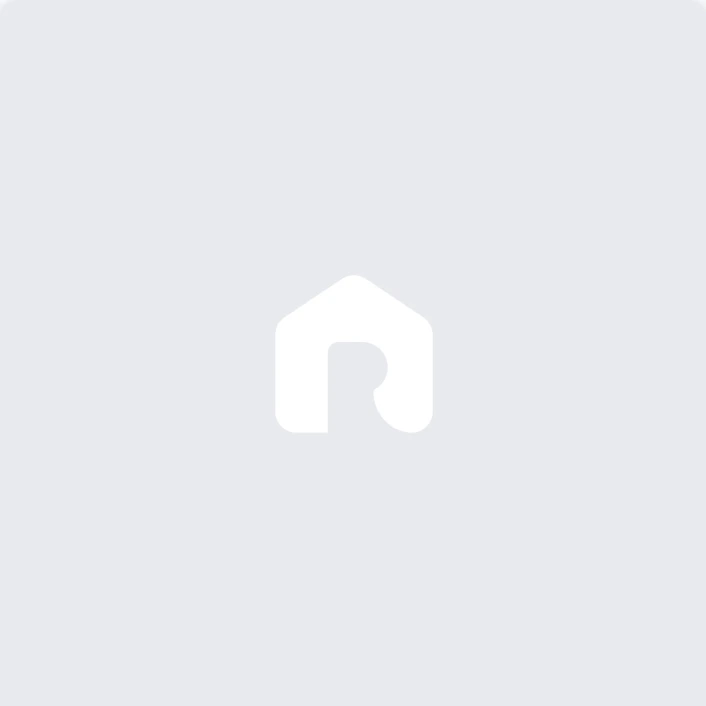

In [20]:
soup = BeautifulSoup(response.content)
soup

In [21]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
Buffalo_NY = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(Buffalo_NY)
    

                                                  City  \
0             48 Layton Avenue, Buffalo, NY 14226, USA   
1       383 Victoria Boulevard, Buffalo, NY 14217, USA   
2          102 Mulberry Street, Buffalo, NY 14204, USA   
3          452 Franklin Street, Buffalo, NY 14202, USA   
4                                          Buffalo, NY   
..                                                 ...   
700  786 Kenmore Avenue, Kenilworth, Buffalo, NY 14...   
701      77 North Johnson Park, Buffalo, NY 14201, USA   
702        103 Kimberly Avenue, Buffalo, NY 14220, USA   
703       129 Claremont Avenue, Buffalo, NY 14222, USA   
704                                       114 Grove St   

                                            State_code  \
0             48 Layton Avenue, Buffalo, NY 14226, USA   
1       383 Victoria Boulevard, Buffalo, NY 14217, USA   
2          102 Mulberry Street, Buffalo, NY 14204, USA   
3          452 Franklin Street, Buffalo, NY 14202, USA   
4            

In [22]:
Buffalo_NY

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"48 Layton Avenue, Buffalo, NY 14226, USA","48 Layton Avenue, Buffalo, NY 14226, USA","48 Layton Avenue, Buffalo, NY 14226, USA","$1,250",No,815 Sq Ft,1,2,"48 Layton Avenue, Buffalo, NY 14226, USA","$1,250",No,No,No,No,No,No,No,No
1,"383 Victoria Boulevard, Buffalo, NY 14217, USA","383 Victoria Boulevard, Buffalo, NY 14217, USA","383 Victoria Boulevard, Buffalo, NY 14217, USA","$1,400",No,1764 Sq Ft,1,2,"383 Victoria Boulevard, Buffalo, NY 14217, USA","$1,400",No,No,No,No,No,No,No,No
2,"102 Mulberry Street, Buffalo, NY 14204, USA","102 Mulberry Street, Buffalo, NY 14204, USA","102 Mulberry Street, Buffalo, NY 14204, USA","$1,200",No,1684 Sq Ft,1,2,"102 Mulberry Street, Buffalo, NY 14204, USA","$1,200",No,No,No,No,No,No,No,No
3,"452 Franklin Street, Buffalo, NY 14202, USA","452 Franklin Street, Buffalo, NY 14202, USA","452 Franklin Street, Buffalo, NY 14202, USA","$1,200",No,900 Sq Ft,1,1,"452 Franklin Street, Buffalo, NY 14202, USA","$1,200",No,No,No,No,No,No,No,No
4,"Buffalo, NY","Buffalo, NY","Buffalo, NY","$3,780",No,udio,t,S,"Buffalo, NY","$3,780",No,No,Yes,No,Yes,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
700,"786 Kenmore Avenue, Kenilworth, Buffalo, NY 14...","786 Kenmore Avenue, Kenilworth, Buffalo, NY 14...","786 Kenmore Avenue, Kenilworth, Buffalo, NY 14...","$1,395",No,1294 Sq Ft,1,2,"786 Kenmore Avenue, Kenilworth, Buffalo, NY 14...","$1,395",No,No,No,No,No,No,No,No
701,"77 North Johnson Park, Buffalo, NY 14201, USA","77 North Johnson Park, Buffalo, NY 14201, USA","77 North Johnson Park, Buffalo, NY 14201, USA",$800,No,udio1400 Sq Ft,t,S,"77 North Johnson Park, Buffalo, NY 14201, USA",$800,No,No,No,No,No,No,No,No
702,"103 Kimberly Avenue, Buffalo, NY 14220, USA","103 Kimberly Avenue, Buffalo, NY 14220, USA","103 Kimberly Avenue, Buffalo, NY 14220, USA","$1,050",No,817 Sq Ft,1,2,"103 Kimberly Avenue, Buffalo, NY 14220, USA","$1,050",No,No,No,No,No,No,No,No
703,"129 Claremont Avenue, Buffalo, NY 14222, USA","129 Claremont Avenue, Buffalo, NY 14222, USA","129 Claremont Avenue, Buffalo, NY 14222, USA","$2,000",No,1218 Sq Ft,1,2,"129 Claremont Avenue, Buffalo, NY 14222, USA","$2,000",No,No,No,No,No,No,No,No


In [23]:
Buffalo_NY=Buffalo_NY.assign(SNo=range(len(Buffalo_NY)))
titles=list(Buffalo_NY.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
Buffalo_NY=Buffalo_NY[titles]
Buffalo_NY.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"48 Layton Avenue, Buffalo, NY 14226, USA","48 Layton Avenue, Buffalo, NY 14226, USA","$1,250",No,815 Sq Ft,1,2,"48 Layton Avenue, Buffalo, NY 14226, USA","$1,250",No,No,No,No,No,No,No,No,"48 Layton Avenue, Buffalo, NY 14226, USA"
1,1,"383 Victoria Boulevard, Buffalo, NY 14217, USA","383 Victoria Boulevard, Buffalo, NY 14217, USA","$1,400",No,1764 Sq Ft,1,2,"383 Victoria Boulevard, Buffalo, NY 14217, USA","$1,400",No,No,No,No,No,No,No,No,"383 Victoria Boulevard, Buffalo, NY 14217, USA"
2,2,"102 Mulberry Street, Buffalo, NY 14204, USA","102 Mulberry Street, Buffalo, NY 14204, USA","$1,200",No,1684 Sq Ft,1,2,"102 Mulberry Street, Buffalo, NY 14204, USA","$1,200",No,No,No,No,No,No,No,No,"102 Mulberry Street, Buffalo, NY 14204, USA"
3,3,"452 Franklin Street, Buffalo, NY 14202, USA","452 Franklin Street, Buffalo, NY 14202, USA","$1,200",No,900 Sq Ft,1,1,"452 Franklin Street, Buffalo, NY 14202, USA","$1,200",No,No,No,No,No,No,No,No,"452 Franklin Street, Buffalo, NY 14202, USA"
4,4,"Buffalo, NY","Buffalo, NY","$3,780",No,udio,t,S,"Buffalo, NY","$3,780",No,No,Yes,No,Yes,No,No,No,"Buffalo, NY"


### now i see the 

In [24]:
url =  "https://rentberry.com/apartments/s/dallas-tx"

In [25]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [26]:

response = requests.get(url, headers=headers)

In [27]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
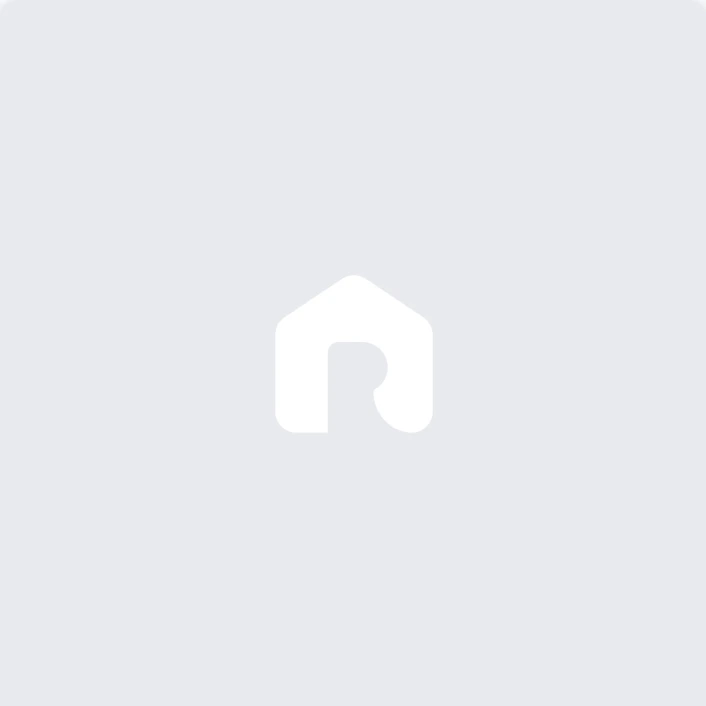

In [28]:
soup = BeautifulSoup(response.content)
soup

In [29]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
dallas_tx = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(dallas_tx)
    

                                              City  \
0                                1205 Hillsdale Dr   
1       3014 Modella Avenue, Dallas, TX 75229, USA   
2          unnamed road, Lewisville, TX 75067, USA   
3        1127 Manacore Lane, Dallas, TX 75212, USA   
4    6038 Monticello Avenue, Dallas, TX 75214, USA   
..                                             ...   
795      2521 Madera Street, Dallas, TX 75206, USA   
796     3660 Rickshaw Drive, Dallas, TX 75229, USA   
797    4020 Kirkmeadow Lane, Dallas, TX 75287, USA   
798                                     Dallas, TX   
799        3125 Ross Avenue, Dallas, TX 75204, USA   

                                        State_code  \
0                                1205 Hillsdale Dr   
1       3014 Modella Avenue, Dallas, TX 75229, USA   
2          unnamed road, Lewisville, TX 75067, USA   
3        1127 Manacore Lane, Dallas, TX 75212, USA   
4    6038 Monticello Avenue, Dallas, TX 75214, USA   
..                         

In [30]:
dallas_tx.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,1205 Hillsdale Dr,1205 Hillsdale Dr,1205 Hillsdale Dr,"$9,750",No,2597 Sq Ft,3,5,1205 Hillsdale Dr,"$9,750",No,No,No,No,Yes,No,No,No
1,"3014 Modella Avenue, Dallas, TX 75229, USA","3014 Modella Avenue, Dallas, TX 75229, USA","3014 Modella Avenue, Dallas, TX 75229, USA","$2,780",No,1648 Sq Ft,2,2,"3014 Modella Avenue, Dallas, TX 75229, USA","$2,780",No,No,No,No,No,No,No,No
2,"unnamed road, Lewisville, TX 75067, USA","unnamed road, Lewisville, TX 75067, USA","unnamed road, Lewisville, TX 75067, USA","$2,950",No,.52075 Sq Ft,2,3,"unnamed road, Lewisville, TX 75067, USA","$2,950",No,No,No,No,No,No,No,No
3,"1127 Manacore Lane, Dallas, TX 75212, USA","1127 Manacore Lane, Dallas, TX 75212, USA","1127 Manacore Lane, Dallas, TX 75212, USA","$3,500",No,.51827 Sq Ft,2,3,"1127 Manacore Lane, Dallas, TX 75212, USA","$3,500",No,No,No,No,No,No,No,No
4,"6038 Monticello Avenue, Dallas, TX 75214, USA","6038 Monticello Avenue, Dallas, TX 75214, USA","6038 Monticello Avenue, Dallas, TX 75214, USA","$6,200",No,1775 Sq Ft,3,3,"6038 Monticello Avenue, Dallas, TX 75214, USA","$6,200",No,No,No,No,No,No,No,No


In [31]:
dallas_tx=dallas_tx.assign(SNo=range(len(dallas_tx)))
titles=list(dallas_tx.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
dallas_tx=dallas_tx[titles]
dallas_tx.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,1205 Hillsdale Dr,1205 Hillsdale Dr,"$9,750",No,2597 Sq Ft,3,5,1205 Hillsdale Dr,"$9,750",No,No,No,No,Yes,No,No,No,1205 Hillsdale Dr
1,1,"3014 Modella Avenue, Dallas, TX 75229, USA","3014 Modella Avenue, Dallas, TX 75229, USA","$2,780",No,1648 Sq Ft,2,2,"3014 Modella Avenue, Dallas, TX 75229, USA","$2,780",No,No,No,No,No,No,No,No,"3014 Modella Avenue, Dallas, TX 75229, USA"
2,2,"unnamed road, Lewisville, TX 75067, USA","unnamed road, Lewisville, TX 75067, USA","$2,950",No,.52075 Sq Ft,2,3,"unnamed road, Lewisville, TX 75067, USA","$2,950",No,No,No,No,No,No,No,No,"unnamed road, Lewisville, TX 75067, USA"
3,3,"1127 Manacore Lane, Dallas, TX 75212, USA","1127 Manacore Lane, Dallas, TX 75212, USA","$3,500",No,.51827 Sq Ft,2,3,"1127 Manacore Lane, Dallas, TX 75212, USA","$3,500",No,No,No,No,No,No,No,No,"1127 Manacore Lane, Dallas, TX 75212, USA"
4,4,"6038 Monticello Avenue, Dallas, TX 75214, USA","6038 Monticello Avenue, Dallas, TX 75214, USA","$6,200",No,1775 Sq Ft,3,3,"6038 Monticello Avenue, Dallas, TX 75214, USA","$6,200",No,No,No,No,No,No,No,No,"6038 Monticello Avenue, Dallas, TX 75214, USA"


In [ ]:
#jersey-city

In [32]:
url = "https://rentberry.com/apartments/s/jersey-city-nj"

In [33]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [34]:

response = requests.get(url, headers=headers)

In [35]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
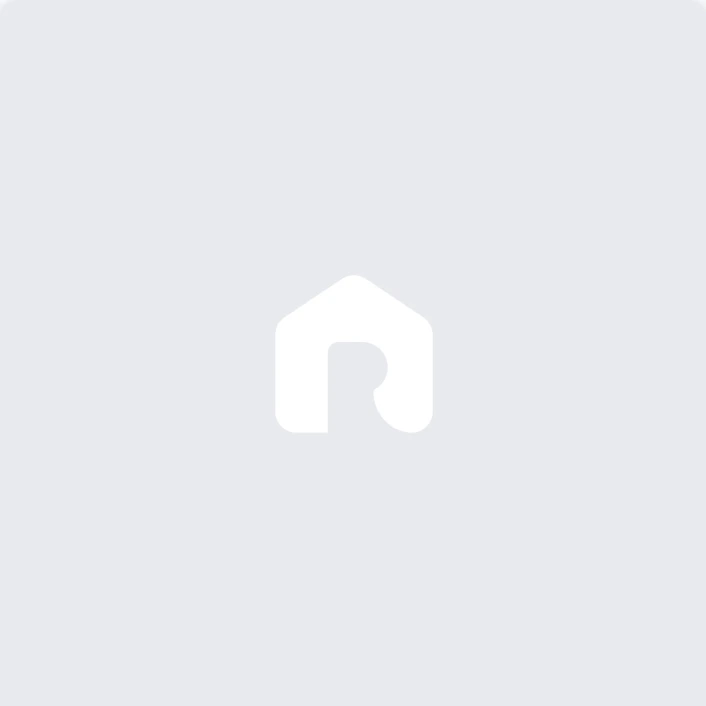

In [36]:
soup = BeautifulSoup(response.content)
soup

In [37]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
jersey_city = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(jersey_city)
    

                                                  City  \
0      851 Garfield Avenue, Jersey City, NJ 07305, USA   
1    Observer Plaza, Newark Street, Hoboken, NJ 073...   
2    Hudson River Waterfront Walkway, Jersey City, ...   
3          44 West 30th Street, Bayonne, NJ 07002, USA   
4         550 Observer Highway, Hoboken, NJ 07030, USA   
..                                                 ...   
795                                 Hoboken, NJ, 07030   
796         499 19th Street, Union City, NJ 07087, USA   
797             604 4th Street, Hoboken, NJ 07030, USA   
798      26 Terrace Avenue, Jersey City, NJ 07307, USA   
799  22 Wallis Avenue, Marion, Jersey City, NJ 0709...   

                                            State_code  \
0      851 Garfield Avenue, Jersey City, NJ 07305, USA   
1    Observer Plaza, Newark Street, Hoboken, NJ 073...   
2    Hudson River Waterfront Walkway, Jersey City, ...   
3          44 West 30th Street, Bayonne, NJ 07002, USA   
4         550

In [38]:
jersey_city.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"851 Garfield Avenue, Jersey City, NJ 07305, USA","851 Garfield Avenue, Jersey City, NJ 07305, USA","851 Garfield Avenue, Jersey City, NJ 07305, USA","$2,769",No,988 Sq Ft,2,2,"851 Garfield Avenue, Jersey City, NJ 07305, USA","$2,769",No,No,No,No,No,No,No,No
1,"Observer Plaza, Newark Street, Hoboken, NJ 073...","Observer Plaza, Newark Street, Hoboken, NJ 073...","Observer Plaza, Newark Street, Hoboken, NJ 073...","$15,995",No,2250 Sq Ft,2,4,"Observer Plaza, Newark Street, Hoboken, NJ 073...","$15,995",No,No,No,No,No,No,No,No
2,"Hudson River Waterfront Walkway, Jersey City, ...","Hudson River Waterfront Walkway, Jersey City, ...","Hudson River Waterfront Walkway, Jersey City, ...","$5,200",No,.51700 Sq Ft,2,3,"Hudson River Waterfront Walkway, Jersey City, ...","$5,200",No,No,No,No,No,No,No,No
3,"44 West 30th Street, Bayonne, NJ 07002, USA","44 West 30th Street, Bayonne, NJ 07002, USA","44 West 30th Street, Bayonne, NJ 07002, USA","$2,500",No,,1,3,"44 West 30th Street, Bayonne, NJ 07002, USA","$2,500",No,No,No,No,No,No,No,No
4,"550 Observer Highway, Hoboken, NJ 07030, USA","550 Observer Highway, Hoboken, NJ 07030, USA","550 Observer Highway, Hoboken, NJ 07030, USA","$2,800",No,800 Sq Ft,1,2,"550 Observer Highway, Hoboken, NJ 07030, USA","$2,800",No,No,No,No,No,No,No,No


In [39]:
jersey_city=jersey_city.assign(SNo=range(len(jersey_city)))
titles=list(jersey_city.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
jersey_city=jersey_city[titles]
jersey_city.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"851 Garfield Avenue, Jersey City, NJ 07305, USA","851 Garfield Avenue, Jersey City, NJ 07305, USA","$2,769",No,988 Sq Ft,2,2,"851 Garfield Avenue, Jersey City, NJ 07305, USA","$2,769",No,No,No,No,No,No,No,No,"851 Garfield Avenue, Jersey City, NJ 07305, USA"
1,1,"Observer Plaza, Newark Street, Hoboken, NJ 073...","Observer Plaza, Newark Street, Hoboken, NJ 073...","$15,995",No,2250 Sq Ft,2,4,"Observer Plaza, Newark Street, Hoboken, NJ 073...","$15,995",No,No,No,No,No,No,No,No,"Observer Plaza, Newark Street, Hoboken, NJ 073..."
2,2,"Hudson River Waterfront Walkway, Jersey City, ...","Hudson River Waterfront Walkway, Jersey City, ...","$5,200",No,.51700 Sq Ft,2,3,"Hudson River Waterfront Walkway, Jersey City, ...","$5,200",No,No,No,No,No,No,No,No,"Hudson River Waterfront Walkway, Jersey City, ..."
3,3,"44 West 30th Street, Bayonne, NJ 07002, USA","44 West 30th Street, Bayonne, NJ 07002, USA","$2,500",No,,1,3,"44 West 30th Street, Bayonne, NJ 07002, USA","$2,500",No,No,No,No,No,No,No,No,"44 West 30th Street, Bayonne, NJ 07002, USA"
4,4,"550 Observer Highway, Hoboken, NJ 07030, USA","550 Observer Highway, Hoboken, NJ 07030, USA","$2,800",No,800 Sq Ft,1,2,"550 Observer Highway, Hoboken, NJ 07030, USA","$2,800",No,No,No,No,No,No,No,No,"550 Observer Highway, Hoboken, NJ 07030, USA"


In [ ]:
#las-vegas

In [40]:
url = "https://rentberry.com/apartments/s/las-vegas-nv"

In [41]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [42]:

response = requests.get(url, headers=headers)

In [43]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
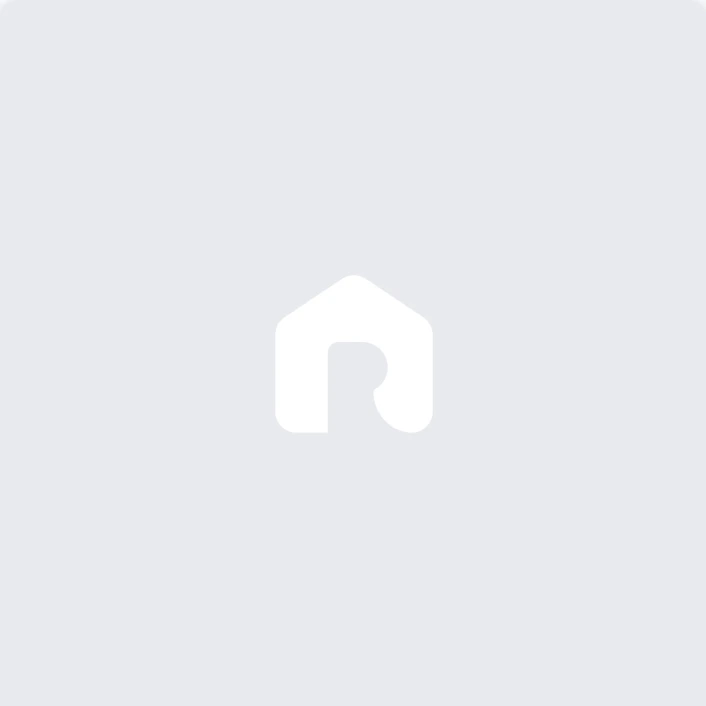

In [45]:
soup = BeautifulSoup(response.content)
soup

In [46]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
las_vegas = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(las_vegas)

                                                  City  \
0                      2221 West Bonanza Road, Unit 69   
1           291 Tower Street, Las Vegas, NV 89101, USA   
2       Black Canaray Avenue, Las Vegas, NV 89138, USA   
3          1090 Yucca Avenue, Las Vegas, NV 89104, USA   
4     Juhl, South 3rd Street, Las Vegas, NV 89101, USA   
..                                                 ...   
795  7713 Wishbone Falls Street, North Las Vegas, N...   
796  6658 Cinnabar Coast Lane, North Las Vegas, NV ...   
797     2748 Heritage Court, Winchester, NV 89121, USA   
798  8634 West Gilmore Avenue, Las Vegas, NV 89129,...   
799  10409 Warwick Falls Court, Las Vegas, NV 89144...   

                                            State_code  \
0                      2221 West Bonanza Road, Unit 69   
1           291 Tower Street, Las Vegas, NV 89101, USA   
2       Black Canaray Avenue, Las Vegas, NV 89138, USA   
3          1090 Yucca Avenue, Las Vegas, NV 89104, USA   
4     Juhl, S

In [47]:
las_vegas.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"2221 West Bonanza Road, Unit 69","2221 West Bonanza Road, Unit 69","2221 West Bonanza Road, Unit 69",$950,No,400 Sq Ft,1,1,"2221 West Bonanza Road, Unit 69",$950,Yes,No,No,No,Yes,No,No,Yes
1,"291 Tower Street, Las Vegas, NV 89101, USA","291 Tower Street, Las Vegas, NV 89101, USA","291 Tower Street, Las Vegas, NV 89101, USA","$2,250",No,1857 Sq Ft,2,2,"291 Tower Street, Las Vegas, NV 89101, USA","$2,250",No,No,No,No,No,No,No,No
2,"Black Canaray Avenue, Las Vegas, NV 89138, USA","Black Canaray Avenue, Las Vegas, NV 89138, USA","Black Canaray Avenue, Las Vegas, NV 89138, USA","$2,850",No,2114 Sq Ft,3,4,"Black Canaray Avenue, Las Vegas, NV 89138, USA","$2,850",No,No,No,No,No,No,No,No
3,"1090 Yucca Avenue, Las Vegas, NV 89104, USA","1090 Yucca Avenue, Las Vegas, NV 89104, USA","1090 Yucca Avenue, Las Vegas, NV 89104, USA","$2,200",No,.5788 Sq Ft,1,2,"1090 Yucca Avenue, Las Vegas, NV 89104, USA","$2,200",No,No,No,No,No,No,No,No
4,"Juhl, South 3rd Street, Las Vegas, NV 89101, USA","Juhl, South 3rd Street, Las Vegas, NV 89101, USA","Juhl, South 3rd Street, Las Vegas, NV 89101, USA","$2,250",No,984 Sq Ft,2,2,"Juhl, South 3rd Street, Las Vegas, NV 89101, USA","$2,250",No,No,No,No,No,No,No,No


In [48]:
las_vegas=las_vegas.assign(SNo=range(len(las_vegas)))
titles=list(las_vegas.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
las_vegas=las_vegas[titles]
las_vegas.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"2221 West Bonanza Road, Unit 69","2221 West Bonanza Road, Unit 69",$950,No,400 Sq Ft,1,1,"2221 West Bonanza Road, Unit 69",$950,Yes,No,No,No,Yes,No,No,Yes,"2221 West Bonanza Road, Unit 69"
1,1,"291 Tower Street, Las Vegas, NV 89101, USA","291 Tower Street, Las Vegas, NV 89101, USA","$2,250",No,1857 Sq Ft,2,2,"291 Tower Street, Las Vegas, NV 89101, USA","$2,250",No,No,No,No,No,No,No,No,"291 Tower Street, Las Vegas, NV 89101, USA"
2,2,"Black Canaray Avenue, Las Vegas, NV 89138, USA","Black Canaray Avenue, Las Vegas, NV 89138, USA","$2,850",No,2114 Sq Ft,3,4,"Black Canaray Avenue, Las Vegas, NV 89138, USA","$2,850",No,No,No,No,No,No,No,No,"Black Canaray Avenue, Las Vegas, NV 89138, USA"
3,3,"1090 Yucca Avenue, Las Vegas, NV 89104, USA","1090 Yucca Avenue, Las Vegas, NV 89104, USA","$2,200",No,.5788 Sq Ft,1,2,"1090 Yucca Avenue, Las Vegas, NV 89104, USA","$2,200",No,No,No,No,No,No,No,No,"1090 Yucca Avenue, Las Vegas, NV 89104, USA"
4,4,"Juhl, South 3rd Street, Las Vegas, NV 89101, USA","Juhl, South 3rd Street, Las Vegas, NV 89101, USA","$2,250",No,984 Sq Ft,2,2,"Juhl, South 3rd Street, Las Vegas, NV 89101, USA","$2,250",No,No,No,No,No,No,No,No,"Juhl, South 3rd Street, Las Vegas, NV 89101, USA"


In [ ]:
#Miami

In [49]:
url = "https://rentberry.com/apartments/s/miami-fl"

In [50]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [51]:

response = requests.get(url, headers=headers)

In [52]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
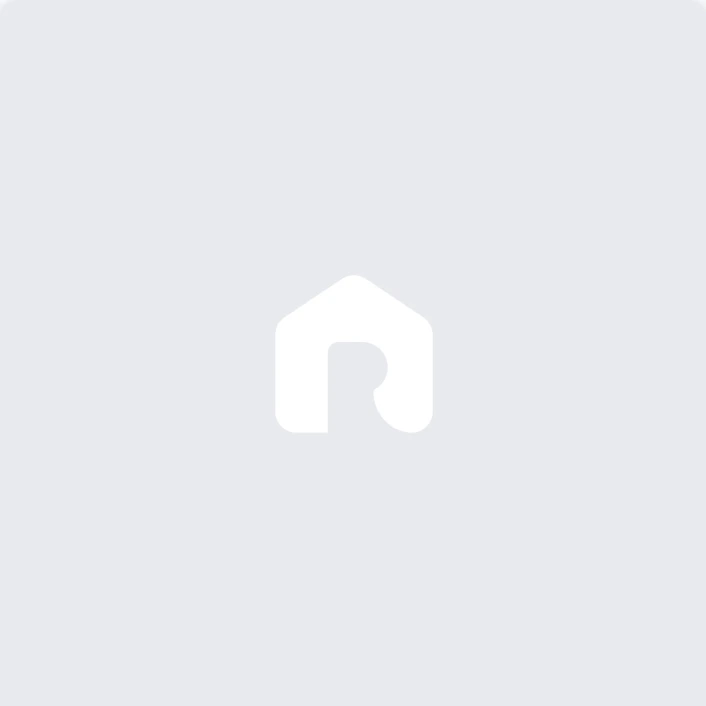

In [53]:
soup = BeautifulSoup(response.content)
soup

In [54]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
miami_fl = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(miami_fl)

                                                  City  \
0                             650 NE 2nd Ave, Unit TWO   
1                               540 Brickell Key Drive   
2                           1536 Northwest 15th Avenue   
3                           5770 Southwest 9th Terrace   
4                                     2517 SW 32nd Ave   
..                                                 ...   
795                                          Miami, FL   
796                               3811 Shipping Avenue   
797  Midtown 2, Northeast 1st Avenue, Buena Vista, ...   
798                                          Miami, FL   
799  Met 1, 300 Biscayne Boulevard, Miami, FL 33131...   

                                            State_code  \
0                             650 NE 2nd Ave, Unit TWO   
1                               540 Brickell Key Drive   
2                           1536 Northwest 15th Avenue   
3                           5770 Southwest 9th Terrace   
4            

In [55]:
miami_fl.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"650 NE 2nd Ave, Unit TWO","650 NE 2nd Ave, Unit TWO","650 NE 2nd Ave, Unit TWO","$3,850",No,979 Sq Ft,2,2,"650 NE 2nd Ave, Unit TWO","$3,850",Yes,No,No,No,Yes,Yes,No,Yes
1,540 Brickell Key Drive,540 Brickell Key Drive,540 Brickell Key Drive,"$3,100",No,640 Sq Ft,1,1,540 Brickell Key Drive,"$3,100",No,No,No,No,No,No,No,No
2,1536 Northwest 15th Avenue,1536 Northwest 15th Avenue,1536 Northwest 15th Avenue,"$1,800",No,udio1455 Sq Ft,t,S,1536 Northwest 15th Avenue,"$1,800",No,No,No,No,No,No,No,No
3,5770 Southwest 9th Terrace,5770 Southwest 9th Terrace,5770 Southwest 9th Terrace,"$7,450",No,2160 Sq Ft,3,5,5770 Southwest 9th Terrace,"$7,450",No,No,No,No,No,No,No,No
4,2517 SW 32nd Ave,2517 SW 32nd Ave,2517 SW 32nd Ave,"$3,300",No,1300 Sq Ft,2,3,2517 SW 32nd Ave,"$3,300",No,No,No,No,Yes,No,No,No


In [56]:
miami_fl=miami_fl.assign(SNo=range(len(miami_fl)))
titles=list(miami_fl.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
miami_fl=miami_fl[titles]
miami_fl.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"650 NE 2nd Ave, Unit TWO","650 NE 2nd Ave, Unit TWO","$3,850",No,979 Sq Ft,2,2,"650 NE 2nd Ave, Unit TWO","$3,850",Yes,No,No,No,Yes,Yes,No,Yes,"650 NE 2nd Ave, Unit TWO"
1,1,540 Brickell Key Drive,540 Brickell Key Drive,"$3,100",No,640 Sq Ft,1,1,540 Brickell Key Drive,"$3,100",No,No,No,No,No,No,No,No,540 Brickell Key Drive
2,2,1536 Northwest 15th Avenue,1536 Northwest 15th Avenue,"$1,800",No,udio1455 Sq Ft,t,S,1536 Northwest 15th Avenue,"$1,800",No,No,No,No,No,No,No,No,1536 Northwest 15th Avenue
3,3,5770 Southwest 9th Terrace,5770 Southwest 9th Terrace,"$7,450",No,2160 Sq Ft,3,5,5770 Southwest 9th Terrace,"$7,450",No,No,No,No,No,No,No,No,5770 Southwest 9th Terrace
4,4,2517 SW 32nd Ave,2517 SW 32nd Ave,"$3,300",No,1300 Sq Ft,2,3,2517 SW 32nd Ave,"$3,300",No,No,No,No,Yes,No,No,No,2517 SW 32nd Ave


In [ ]:
#orlando-fl

In [57]:
url = "https://rentberry.com/apartments/s/orlando-fl"

In [58]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [59]:

response = requests.get(url, headers=headers)

In [60]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
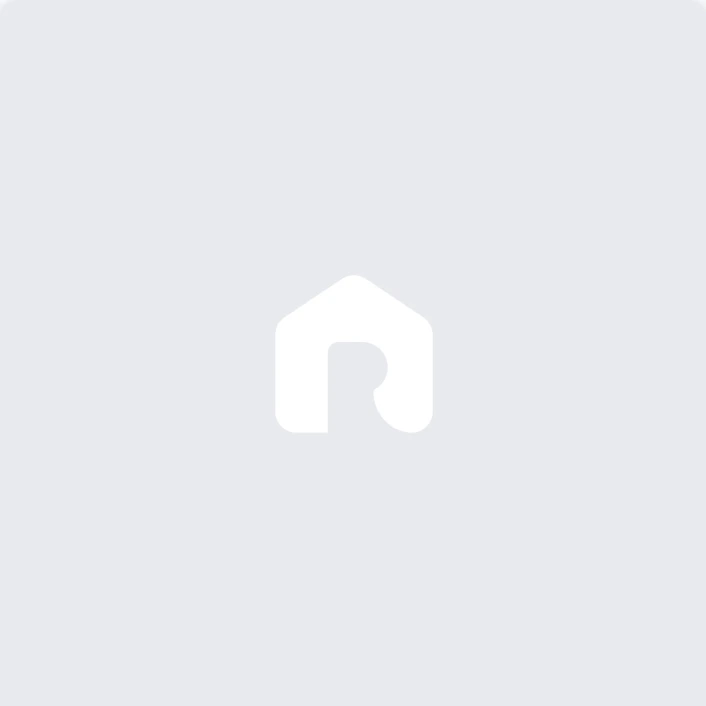

In [61]:
soup = BeautifulSoup(response.content)
soup

In [62]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
orlando_fl = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(orlando_fl)

                                                  City  \
0        Heintzelman Boulevard, Orlando, FL 32827, USA   
1           13559 Doisy Street, Orlando, FL 32827, USA   
2    8586 Sandberry Boulevard, Dr. Phillips, FL 328...   
3    9092 Fort Jefferson Boulevard, Orange County, ...   
4              Ward Road, Orange County, FL 34743, USA   
..                                                 ...   
795                                        Orlando, FL   
796                                 Orlando, FL, 32896   
797                                        Orlando, FL   
798                                        Orlando, FL   
799                                        Orlando, FL   

                                            State_code  \
0        Heintzelman Boulevard, Orlando, FL 32827, USA   
1           13559 Doisy Street, Orlando, FL 32827, USA   
2    8586 Sandberry Boulevard, Dr. Phillips, FL 328...   
3    9092 Fort Jefferson Boulevard, Orange County, ...   
4            

In [63]:
orlando_fl.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Heintzelman Boulevard, Orlando, FL 32827, USA","Heintzelman Boulevard, Orlando, FL 32827, USA","Heintzelman Boulevard, Orlando, FL 32827, USA","$4,800",No,3136 Sq Ft,3,4,"Heintzelman Boulevard, Orlando, FL 32827, USA","$4,800",No,No,No,No,No,No,No,No
1,"13559 Doisy Street, Orlando, FL 32827, USA","13559 Doisy Street, Orlando, FL 32827, USA","13559 Doisy Street, Orlando, FL 32827, USA","$3,950",No,2768 Sq Ft,3,4,"13559 Doisy Street, Orlando, FL 32827, USA","$3,950",No,No,No,No,No,No,No,No
2,"8586 Sandberry Boulevard, Dr. Phillips, FL 328...","8586 Sandberry Boulevard, Dr. Phillips, FL 328...","8586 Sandberry Boulevard, Dr. Phillips, FL 328...","$3,600",No,1904 Sq Ft,2,4,"8586 Sandberry Boulevard, Dr. Phillips, FL 328...","$3,600",No,No,No,No,No,No,No,No
3,"9092 Fort Jefferson Boulevard, Orange County, ...","9092 Fort Jefferson Boulevard, Orange County, ...","9092 Fort Jefferson Boulevard, Orange County, ...","$2,650",No,1443 Sq Ft,2,3,"9092 Fort Jefferson Boulevard, Orange County, ...","$2,650",No,No,No,No,No,No,No,No
4,"Ward Road, Orange County, FL 34743, USA","Ward Road, Orange County, FL 34743, USA","Ward Road, Orange County, FL 34743, USA","$2,500",No,.51484 Sq Ft,2,3,"Ward Road, Orange County, FL 34743, USA","$2,500",No,No,No,No,No,No,No,No


In [59]:
orlando_fl.shape

(800, 18)

In [64]:
orlando_fl=orlando_fl.assign(SNo=range(len(orlando_fl)))
titles=list(orlando_fl.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
orlando_fl=orlando_fl[titles]
orlando_fl.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Heintzelman Boulevard, Orlando, FL 32827, USA","Heintzelman Boulevard, Orlando, FL 32827, USA","$4,800",No,3136 Sq Ft,3,4,"Heintzelman Boulevard, Orlando, FL 32827, USA","$4,800",No,No,No,No,No,No,No,No,"Heintzelman Boulevard, Orlando, FL 32827, USA"
1,1,"13559 Doisy Street, Orlando, FL 32827, USA","13559 Doisy Street, Orlando, FL 32827, USA","$3,950",No,2768 Sq Ft,3,4,"13559 Doisy Street, Orlando, FL 32827, USA","$3,950",No,No,No,No,No,No,No,No,"13559 Doisy Street, Orlando, FL 32827, USA"
2,2,"8586 Sandberry Boulevard, Dr. Phillips, FL 328...","8586 Sandberry Boulevard, Dr. Phillips, FL 328...","$3,600",No,1904 Sq Ft,2,4,"8586 Sandberry Boulevard, Dr. Phillips, FL 328...","$3,600",No,No,No,No,No,No,No,No,"8586 Sandberry Boulevard, Dr. Phillips, FL 328..."
3,3,"9092 Fort Jefferson Boulevard, Orange County, ...","9092 Fort Jefferson Boulevard, Orange County, ...","$2,650",No,1443 Sq Ft,2,3,"9092 Fort Jefferson Boulevard, Orange County, ...","$2,650",No,No,No,No,No,No,No,No,"9092 Fort Jefferson Boulevard, Orange County, ..."
4,4,"Ward Road, Orange County, FL 34743, USA","Ward Road, Orange County, FL 34743, USA","$2,500",No,.51484 Sq Ft,2,3,"Ward Road, Orange County, FL 34743, USA","$2,500",No,No,No,No,No,No,No,No,"Ward Road, Orange County, FL 34743, USA"


In [ ]:
#ottawa-on

In [65]:
url = "https://rentberry.com/apartments/s/ottawa-on"

In [66]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [67]:

response = requests.get(url, headers=headers)

In [68]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
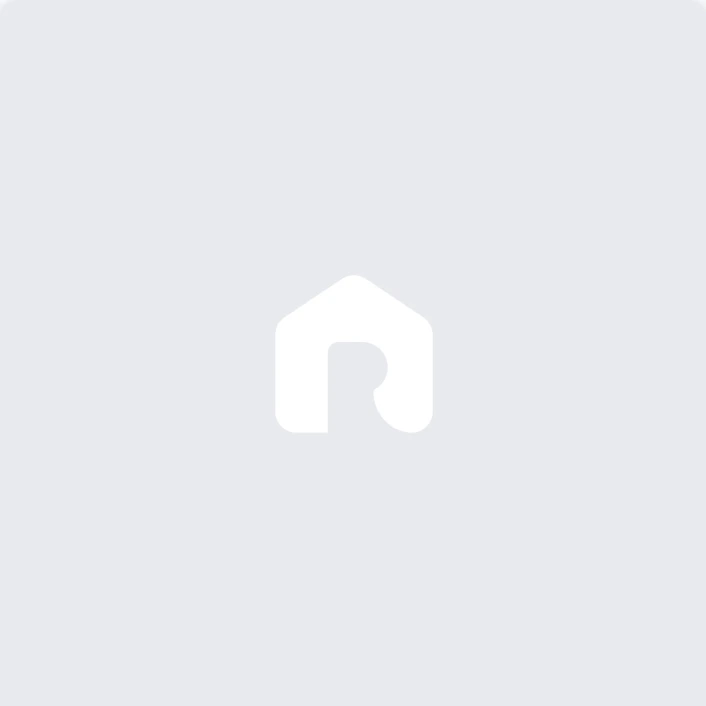

In [69]:
soup = BeautifulSoup(response.content)
soup

In [70]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
ottawa_on = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(ottawa_on)

                                                  City  \
0       137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada   
1    Parliamentary Precinct, Gatineau, QC J8X 3T2, ...   
2                         Gatineau, QC J9A 3W4, Canada   
3                       Ottawa, Beacon Heights, ON, CA   
4      86 Rallidale Street, Ottawa, ON K1X 1G6, Canada   
..                                                 ...   
746  1309 Kennedy Road, North Grenville, ON K0G 1J0...   
747  The Beckett, 192 Bronson Avenue, (Old) Ottawa,...   
748  The Beckett, 192 Bronson Avenue, (Old) Ottawa,...   
749  685 Taliesin Crescent, Ottawa, ON K2S 1K5, Canada   
750  St Joseph / Prestone, St. Joseph Boulevard, Ot...   

                                            State_code  \
0       137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada   
1    Parliamentary Precinct, Gatineau, QC J8X 3T2, ...   
2                         Gatineau, QC J9A 3W4, Canada   
3                       Ottawa, Beacon Heights, ON, CA   
4      86 Ral

In [71]:
ottawa_on.head(150)

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada","137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada","137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada","$3,373",No,,3,1,"137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada","$3,373",No,No,Yes,No,Yes,No,No,No
1,"Parliamentary Precinct, Gatineau, QC J8X 3T2, ...","Parliamentary Precinct, Gatineau, QC J8X 3T2, ...","Parliamentary Precinct, Gatineau, QC J8X 3T2, ...","$5,016",No,1800 Sq Ft,2,2,"Parliamentary Precinct, Gatineau, QC J8X 3T2, ...","$5,016",No,No,Yes,Yes,Yes,No,No,No
2,"Gatineau, QC J9A 3W4, Canada","Gatineau, QC J9A 3W4, Canada","Gatineau, QC J9A 3W4, Canada","$1,647",No,1250 Sq Ft,1,2,"Gatineau, QC J9A 3W4, Canada","$1,647",No,No,No,No,No,No,No,No
3,"Ottawa, Beacon Heights, ON, CA","Ottawa, Beacon Heights, ON, CA","Ottawa, Beacon Heights, ON, CA",$950,No,,1,1,"Ottawa, Beacon Heights, ON, CA",$950,No,No,No,No,No,No,No,No
4,"86 Rallidale Street, Ottawa, ON K1X 1G6, Canada","86 Rallidale Street, Ottawa, ON K1X 1G6, Canada","86 Rallidale Street, Ottawa, ON K1X 1G6, Canada","$2,998",No,,5,3,"86 Rallidale Street, Ottawa, ON K1X 1G6, Canada","$2,998",No,No,Yes,No,Yes,No,No,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,"Central 3 - Hideaway, 340 McLeod Street, Ottaw...","Central 3 - Hideaway, 340 McLeod Street, Ottaw...","Central 3 - Hideaway, 340 McLeod Street, Ottaw...","$2,374",No,,1,1,"Central 3 - Hideaway, 340 McLeod Street, Ottaw...","$2,374",No,No,No,No,Yes,No,No,Yes
146,124 First Ave,124 First Ave,124 First Ave,"$1,723",No,1190 Sq Ft,1,3,124 First Ave,"$1,723",No,No,Yes,No,Yes,No,No,No
147,"Quyon, QC J0X 2V0, Canada","Quyon, QC J0X 2V0, Canada","Quyon, QC J0X 2V0, Canada","$8,003",No,,2,4,"Quyon, QC J0X 2V0, Canada","$8,003",No,No,Yes,No,Yes,No,No,No
148,"316 Lorry Greenberg Drive, Ottawa, ON K1T 3J6,...","316 Lorry Greenberg Drive, Ottawa, ON K1T 3J6,...","316 Lorry Greenberg Drive, Ottawa, ON K1T 3J6,...","$2,311",No,,1,2,"316 Lorry Greenberg Drive, Ottawa, ON K1T 3J6,...","$2,311",No,No,Yes,No,Yes,No,No,No


In [72]:
ottawa_on=ottawa_on.assign(SNo=range(len(ottawa_on)))
titles=list(ottawa_on.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
ottawa_on=ottawa_on[titles]
ottawa_on.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada","137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada","$3,373",No,,3,1,"137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada","$3,373",No,No,Yes,No,Yes,No,No,No,"137 Rideau Terrace, Ottawa, ON K1M 1B2, Canada"
1,1,"Parliamentary Precinct, Gatineau, QC J8X 3T2, ...","Parliamentary Precinct, Gatineau, QC J8X 3T2, ...","$5,016",No,1800 Sq Ft,2,2,"Parliamentary Precinct, Gatineau, QC J8X 3T2, ...","$5,016",No,No,Yes,Yes,Yes,No,No,No,"Parliamentary Precinct, Gatineau, QC J8X 3T2, ..."
2,2,"Gatineau, QC J9A 3W4, Canada","Gatineau, QC J9A 3W4, Canada","$1,647",No,1250 Sq Ft,1,2,"Gatineau, QC J9A 3W4, Canada","$1,647",No,No,No,No,No,No,No,No,"Gatineau, QC J9A 3W4, Canada"
3,3,"Ottawa, Beacon Heights, ON, CA","Ottawa, Beacon Heights, ON, CA",$950,No,,1,1,"Ottawa, Beacon Heights, ON, CA",$950,No,No,No,No,No,No,No,No,"Ottawa, Beacon Heights, ON, CA"
4,4,"86 Rallidale Street, Ottawa, ON K1X 1G6, Canada","86 Rallidale Street, Ottawa, ON K1X 1G6, Canada","$2,998",No,,5,3,"86 Rallidale Street, Ottawa, ON K1X 1G6, Canada","$2,998",No,No,Yes,No,Yes,No,No,Yes,"86 Rallidale Street, Ottawa, ON K1X 1G6, Canada"


In [ ]:
#vancouver-bc

In [73]:
url = "https://rentberry.com/apartments/s/vancouver-bc"

In [74]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [75]:

response = requests.get(url, headers=headers)

In [76]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
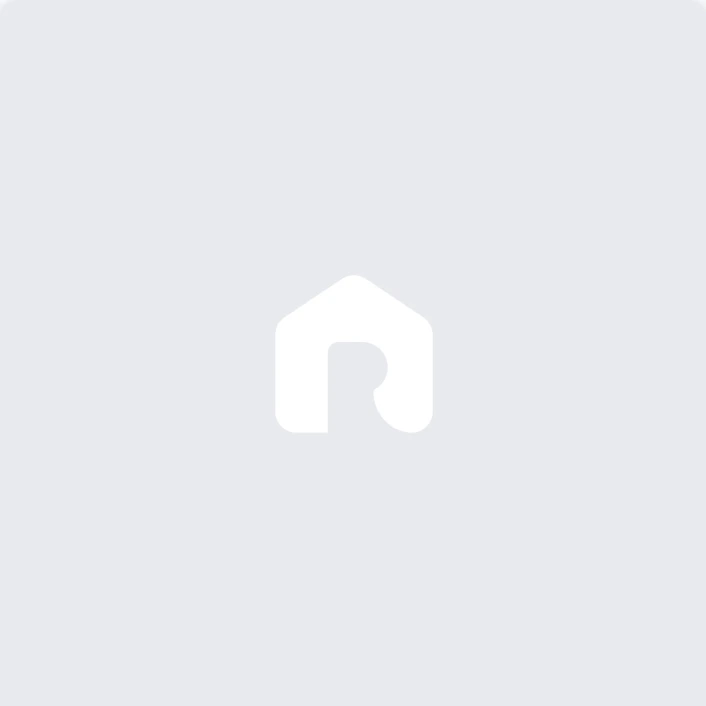

In [77]:
soup = BeautifulSoup(response.content)
soup

In [78]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
vancouver_bc = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(vancouver_bc)

                                                  City  \
0            Trout Lake, Vancouver, BC V5N 2C4, Canada   
1            Riley Park, Vancouver, BC V5V 2Y9, Canada   
2                  North Vancouver, BC V7J 1H3, Canada   
3              Yaletown, Vancouver, BC V6B 6L6, Canada   
4              Yaletown, Vancouver, BC V6Z 1R7, Canada   
..                                                 ...   
795  Vancouver House, 1480 Howe Street, Vancouver, ...   
796          1975 Balsam Street, Vancouver, BC, Canada   
797  Normandie, 1425 Haro Street, Vancouver, BC, Ca...   
798  Viva Tower, 1311 Howe Street, Vancouver, BC V6...   
799  Vancouver School Board District Reception and ...   

                                            State_code  \
0            Trout Lake, Vancouver, BC V5N 2C4, Canada   
1            Riley Park, Vancouver, BC V5V 2Y9, Canada   
2                  North Vancouver, BC V7J 1H3, Canada   
3              Yaletown, Vancouver, BC V6B 6L6, Canada   
4            

In [ ]:
#len(City),len(State_code),len(Country),len( Deposit),len(Pets_allowed),len(Area),len(no_of_Bathroom),
#len(no_of_Bedroom),len(Address),len(Rental_price),len(Washer_Dryer),len(Air_conditioning),len(Parking),len(Fireplace),
len(Dishwasher),len(Hardwood_Floors),len(Roofdeck),len(Roofdeck)

In [79]:
vancouver_bc.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Trout Lake, Vancouver, BC V5N 2C4, Canada","Trout Lake, Vancouver, BC V5N 2C4, Canada","Trout Lake, Vancouver, BC V5N 2C4, Canada","$5,208",No,550 Sq Ft,1,1,"Trout Lake, Vancouver, BC V5N 2C4, Canada","$5,208",No,No,Yes,No,No,No,No,No
1,"Riley Park, Vancouver, BC V5V 2Y9, Canada","Riley Park, Vancouver, BC V5V 2Y9, Canada","Riley Park, Vancouver, BC V5V 2Y9, Canada","$5,897",No,500 Sq Ft,2,1,"Riley Park, Vancouver, BC V5V 2Y9, Canada","$5,897",No,No,Yes,No,No,No,No,No
2,"North Vancouver, BC V7J 1H3, Canada","North Vancouver, BC V7J 1H3, Canada","North Vancouver, BC V7J 1H3, Canada","$6,625",No,,2,2,"North Vancouver, BC V7J 1H3, Canada","$6,625",No,No,Yes,No,No,No,No,No
3,"Yaletown, Vancouver, BC V6B 6L6, Canada","Yaletown, Vancouver, BC V6B 6L6, Canada","Yaletown, Vancouver, BC V6B 6L6, Canada","$4,901",No,700 Sq Ft,1,1,"Yaletown, Vancouver, BC V6B 6L6, Canada","$4,901",No,No,Yes,No,Yes,No,No,No
4,"Yaletown, Vancouver, BC V6Z 1R7, Canada","Yaletown, Vancouver, BC V6Z 1R7, Canada","Yaletown, Vancouver, BC V6Z 1R7, Canada","$5,782",No,500 Sq Ft,1,1,"Yaletown, Vancouver, BC V6Z 1R7, Canada","$5,782",No,No,Yes,No,Yes,No,No,No


In [77]:
vancouver_bc.shape

(800, 18)

In [80]:
vancouver_bc=vancouver_bc.assign(SNo=range(len(vancouver_bc)))
titles=list(vancouver_bc.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
vancouver_bc=vancouver_bc[titles]
vancouver_bc.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Trout Lake, Vancouver, BC V5N 2C4, Canada","Trout Lake, Vancouver, BC V5N 2C4, Canada","$5,208",No,550 Sq Ft,1,1,"Trout Lake, Vancouver, BC V5N 2C4, Canada","$5,208",No,No,Yes,No,No,No,No,No,"Trout Lake, Vancouver, BC V5N 2C4, Canada"
1,1,"Riley Park, Vancouver, BC V5V 2Y9, Canada","Riley Park, Vancouver, BC V5V 2Y9, Canada","$5,897",No,500 Sq Ft,2,1,"Riley Park, Vancouver, BC V5V 2Y9, Canada","$5,897",No,No,Yes,No,No,No,No,No,"Riley Park, Vancouver, BC V5V 2Y9, Canada"
2,2,"North Vancouver, BC V7J 1H3, Canada","North Vancouver, BC V7J 1H3, Canada","$6,625",No,,2,2,"North Vancouver, BC V7J 1H3, Canada","$6,625",No,No,Yes,No,No,No,No,No,"North Vancouver, BC V7J 1H3, Canada"
3,3,"Yaletown, Vancouver, BC V6B 6L6, Canada","Yaletown, Vancouver, BC V6B 6L6, Canada","$4,901",No,700 Sq Ft,1,1,"Yaletown, Vancouver, BC V6B 6L6, Canada","$4,901",No,No,Yes,No,Yes,No,No,No,"Yaletown, Vancouver, BC V6B 6L6, Canada"
4,4,"Yaletown, Vancouver, BC V6Z 1R7, Canada","Yaletown, Vancouver, BC V6Z 1R7, Canada","$5,782",No,500 Sq Ft,1,1,"Yaletown, Vancouver, BC V6Z 1R7, Canada","$5,782",No,No,Yes,No,Yes,No,No,No,"Yaletown, Vancouver, BC V6Z 1R7, Canada"


In [ ]:
#toronto_on

In [81]:
url = "https://rentberry.com/apartments/s/toronto-on"

In [82]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [83]:
response = requests.get(url, headers=headers)

In [84]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
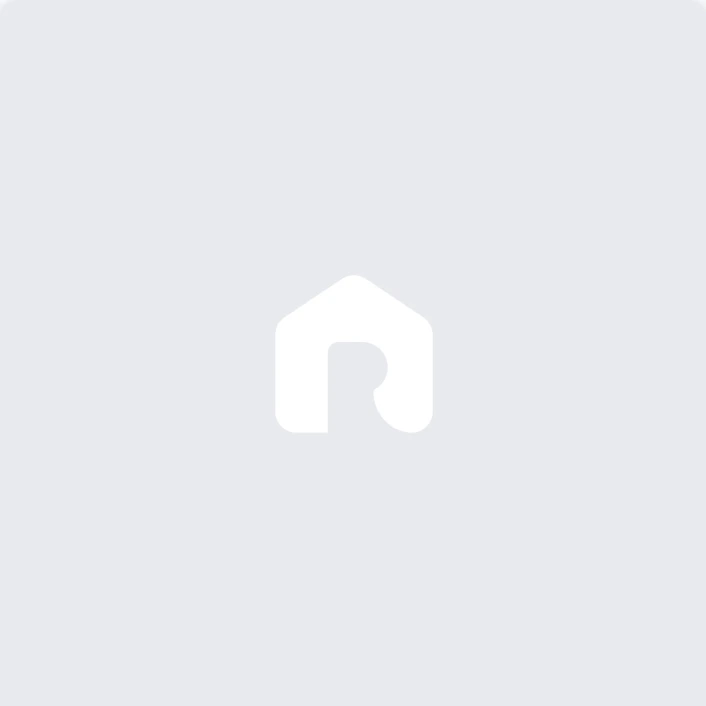

In [85]:
soup = BeautifulSoup(response.content)
soup

In [86]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 26):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
toronto_on = pd.DataFrame({
    'City': City[0:400],
    'State_code':State_code[0:400],
    'Country':Country[0:400],
    'Deposit': Deposit[0:400],
    'Pets_allowed':Pets_allowed[0:400],
    'Area': Area[0:400],
    'no_of_Bathroom': no_of_Bathroom[0:400],
    'no_of_Bedroom': no_of_Bedroom[0:400],
    'Address': Address[0:400],
    'Rental_price': Rental_price[0:400],
    'Washer_Dryer': Washer_Dryer[0:400],
    'Air_conditioning ': Air_conditioning[0:400],
    'Parking': Parking[0:400],
    'Fireplace': Fireplace[0:400],
    'Dishwasher': Dishwasher[0:400],
    'Hardwood_Floors': Hardwood_Floors[0:400],
    'Roofdeck': Roofdeck[0:400],
    'Storage': Storage[0:400]
   
})

# Display DataFrame
print(toronto_on)

                                                  City  \
0                 Spadina, Toronto, ON M5V 1R7, Canada   
1                          Toronto, ON M5V 3W6, Canada   
2    University Plaza, Richmond Street West, Old To...   
3                 Harwood, Toronto, ON M6N 1K8, Canada   
4            Eaton Centre, Toronto, ON M5B 2R3, Canada   
..                                                 ...   
395                                     12 Park Street   
396     Trinity-Bellwoods, Toronto, ON M6J 2K8, Canada   
397  Danforth LINC (Language Instruction for Newcom...   
398                                        Main Street   
399           Grange Park, Toronto, ON M5V 1V3, Canada   

                                            State_code  \
0                 Spadina, Toronto, ON M5V 1R7, Canada   
1                          Toronto, ON M5V 3W6, Canada   
2    University Plaza, Richmond Street West, Old To...   
3                 Harwood, Toronto, ON M6N 1K8, Canada   
4            

In [87]:
toronto_on.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Spadina, Toronto, ON M5V 1R7, Canada","Spadina, Toronto, ON M5V 1R7, Canada","Spadina, Toronto, ON M5V 1R7, Canada","$16,696",No,650 Sq Ft,1,1,"Spadina, Toronto, ON M5V 1R7, Canada","$16,696",No,No,No,No,No,No,No,No
1,"Toronto, ON M5V 3W6, Canada","Toronto, ON M5V 3W6, Canada","Toronto, ON M5V 3W6, Canada","$6,816",No,1259 Sq Ft,2,2,"Toronto, ON M5V 3W6, Canada","$6,816",No,No,No,No,Yes,No,No,No
2,"University Plaza, Richmond Street West, Old To...","University Plaza, Richmond Street West, Old To...","University Plaza, Richmond Street West, Old To...","$2,700",No,57 m2,1,1,"University Plaza, Richmond Street West, Old To...","$2,700",No,No,No,No,No,No,No,No
3,"Harwood, Toronto, ON M6N 1K8, Canada","Harwood, Toronto, ON M6N 1K8, Canada","Harwood, Toronto, ON M6N 1K8, Canada","$10,952",No,,3,3,"Harwood, Toronto, ON M6N 1K8, Canada","$10,952",No,No,Yes,No,Yes,No,No,No
4,"Eaton Centre, Toronto, ON M5B 2R3, Canada","Eaton Centre, Toronto, ON M5B 2R3, Canada","Eaton Centre, Toronto, ON M5B 2R3, Canada","$4,633",No,,1,1,"Eaton Centre, Toronto, ON M5B 2R3, Canada","$4,633",No,No,No,No,No,No,No,No


In [88]:
toronto_on=toronto_on.assign(SNo=range(len(toronto_on)))
titles=list(toronto_on.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
toronto_on=toronto_on[titles]
toronto_on.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Spadina, Toronto, ON M5V 1R7, Canada","Spadina, Toronto, ON M5V 1R7, Canada","$16,696",No,650 Sq Ft,1,1,"Spadina, Toronto, ON M5V 1R7, Canada","$16,696",No,No,No,No,No,No,No,No,"Spadina, Toronto, ON M5V 1R7, Canada"
1,1,"Toronto, ON M5V 3W6, Canada","Toronto, ON M5V 3W6, Canada","$6,816",No,1259 Sq Ft,2,2,"Toronto, ON M5V 3W6, Canada","$6,816",No,No,No,No,Yes,No,No,No,"Toronto, ON M5V 3W6, Canada"
2,2,"University Plaza, Richmond Street West, Old To...","University Plaza, Richmond Street West, Old To...","$2,700",No,57 m2,1,1,"University Plaza, Richmond Street West, Old To...","$2,700",No,No,No,No,No,No,No,No,"University Plaza, Richmond Street West, Old To..."
3,3,"Harwood, Toronto, ON M6N 1K8, Canada","Harwood, Toronto, ON M6N 1K8, Canada","$10,952",No,,3,3,"Harwood, Toronto, ON M6N 1K8, Canada","$10,952",No,No,Yes,No,Yes,No,No,No,"Harwood, Toronto, ON M6N 1K8, Canada"
4,4,"Eaton Centre, Toronto, ON M5B 2R3, Canada","Eaton Centre, Toronto, ON M5B 2R3, Canada","$4,633",No,,1,1,"Eaton Centre, Toronto, ON M5B 2R3, Canada","$4,633",No,No,No,No,No,No,No,No,"Eaton Centre, Toronto, ON M5B 2R3, Canada"


In [ ]:
toronto_on.shape

In [ ]:
#brisbane

In [89]:
url = "https://rentberry.com/apartments/s/brisbane"

In [90]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [91]:

response = requests.get(url, headers=headers)

In [92]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
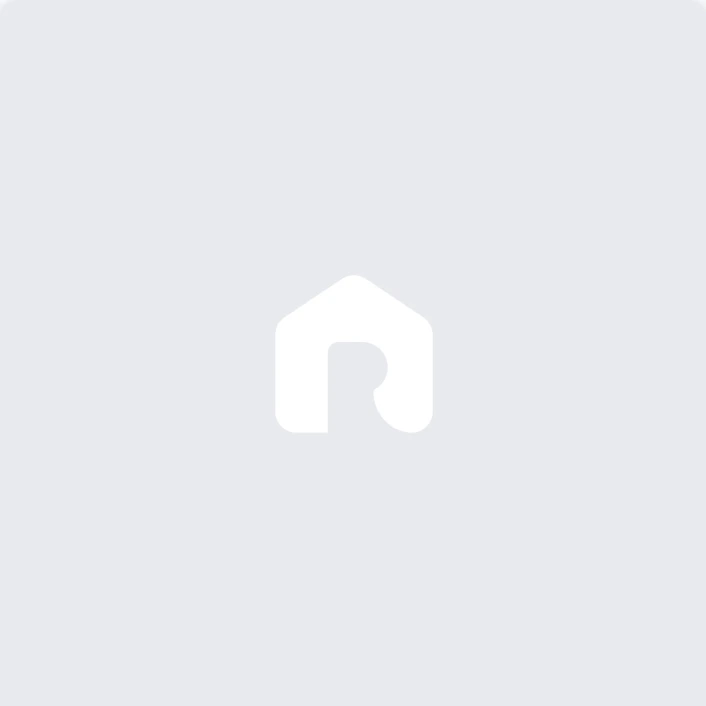

In [93]:
soup = BeautifulSoup(response.content)
soup

In [94]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
brisbane = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(brisbane)

                                                  City  \
0                    Brisbane City QLD 4101, Australia   
1                          Belmont QLD 4153, Australia   
2    South Brisbane, Grey Street, South Brisbane QL...   
3                          Burbank QLD 4156, Australia   
4    South Brisbane, Grey Street, South Brisbane QL...   
..                                                 ...   
795               Greater Brisbane QLD 4017, Australia   
796                       West End QLD 4101, Australia   
797  Auchenflower, Auchenflower Terrace, Auchenflow...   
798                  Brisbane City QLD 4101, Australia   
799                        Newport QLD 4020, Australia   

                                            State_code  \
0                    Brisbane City QLD 4101, Australia   
1                          Belmont QLD 4153, Australia   
2    South Brisbane, Grey Street, South Brisbane QL...   
3                          Burbank QLD 4156, Australia   
4    South Br

In [95]:
brisbane.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Brisbane City QLD 4101, Australia","Brisbane City QLD 4101, Australia","Brisbane City QLD 4101, Australia","$10,056",No,2282 Sq Ft,3,4,"Brisbane City QLD 4101, Australia","$10,056",No,No,Yes,No,Yes,No,No,No
1,"Belmont QLD 4153, Australia","Belmont QLD 4153, Australia","Belmont QLD 4153, Australia","$9,802",No,,3,3,"Belmont QLD 4153, Australia","$9,802",No,No,Yes,No,Yes,No,No,No
2,"South Brisbane, Grey Street, South Brisbane QL...","South Brisbane, Grey Street, South Brisbane QL...","South Brisbane, Grey Street, South Brisbane QL...","$7,680",No,840 Sq Ft,2,2,"South Brisbane, Grey Street, South Brisbane QL...","$7,680",No,No,Yes,No,Yes,No,No,No
3,"Burbank QLD 4156, Australia","Burbank QLD 4156, Australia","Burbank QLD 4156, Australia","$4,201",No,,1,2,"Burbank QLD 4156, Australia","$4,201",No,No,Yes,No,Yes,No,No,No
4,"South Brisbane, Grey Street, South Brisbane QL...","South Brisbane, Grey Street, South Brisbane QL...","South Brisbane, Grey Street, South Brisbane QL...","$8,996",No,11 Sq Ft,1,1,"South Brisbane, Grey Street, South Brisbane QL...","$8,996",No,No,Yes,No,Yes,No,No,No


In [96]:
brisbane=brisbane.assign(SNo=range(len(brisbane)))
titles=list(brisbane.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
brisbane=brisbane[titles]
brisbane.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Brisbane City QLD 4101, Australia","Brisbane City QLD 4101, Australia","$10,056",No,2282 Sq Ft,3,4,"Brisbane City QLD 4101, Australia","$10,056",No,No,Yes,No,Yes,No,No,No,"Brisbane City QLD 4101, Australia"
1,1,"Belmont QLD 4153, Australia","Belmont QLD 4153, Australia","$9,802",No,,3,3,"Belmont QLD 4153, Australia","$9,802",No,No,Yes,No,Yes,No,No,No,"Belmont QLD 4153, Australia"
2,2,"South Brisbane, Grey Street, South Brisbane QL...","South Brisbane, Grey Street, South Brisbane QL...","$7,680",No,840 Sq Ft,2,2,"South Brisbane, Grey Street, South Brisbane QL...","$7,680",No,No,Yes,No,Yes,No,No,No,"South Brisbane, Grey Street, South Brisbane QL..."
3,3,"Burbank QLD 4156, Australia","Burbank QLD 4156, Australia","$4,201",No,,1,2,"Burbank QLD 4156, Australia","$4,201",No,No,Yes,No,Yes,No,No,No,"Burbank QLD 4156, Australia"
4,4,"South Brisbane, Grey Street, South Brisbane QL...","South Brisbane, Grey Street, South Brisbane QL...","$8,996",No,11 Sq Ft,1,1,"South Brisbane, Grey Street, South Brisbane QL...","$8,996",No,No,Yes,No,Yes,No,No,No,"South Brisbane, Grey Street, South Brisbane QL..."


In [ ]:
#melbourne

In [97]:
url = "https://rentberry.com/apartments/s/melbourne"

In [98]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [99]:

response = requests.get(url, headers=headers)

In [100]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
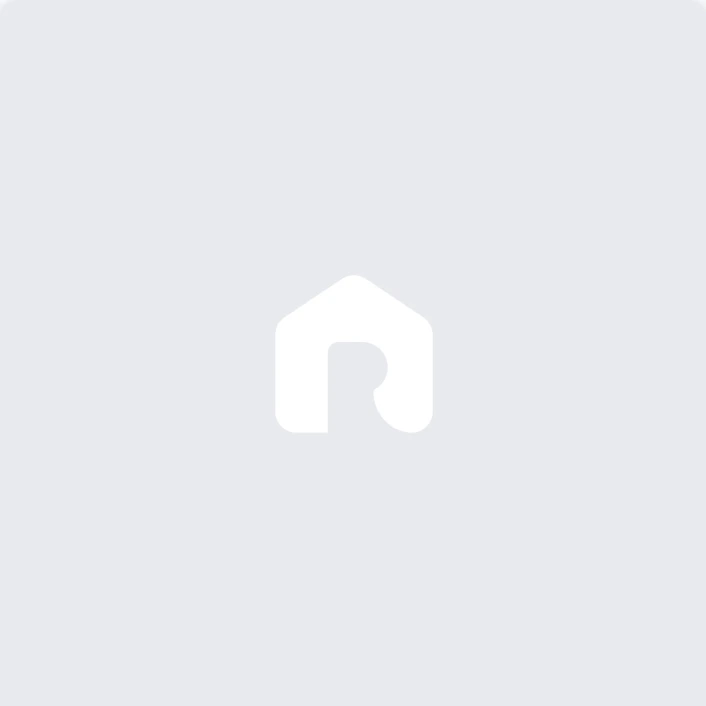

In [101]:
soup = BeautifulSoup(response.content)
soup

In [102]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
melbourne = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(melbourne)

                                                  City  \
0              Portsea, Melbourne, Victoria, Australia   
1          Blairgowrie, Melbourne, Victoria, Australia   
2                  South Melbourne VIC 3205, Australia   
3    Mount Waverley, Waverley Rail Trail, Mount Wav...   
4                     Mount Martha VIC 3934, Australia   
..                                                 ...   
795                       Sorrento VIC 3943, Australia   
796                      Southbank VIC 3006, Australia   
797                  Portarlington VIC 3223, Australia   
798                        Dromana VIC 3936, Australia   
799                       Sorrento VIC 3943, Australia   

                                            State_code  \
0              Portsea, Melbourne, Victoria, Australia   
1          Blairgowrie, Melbourne, Victoria, Australia   
2                  South Melbourne VIC 3205, Australia   
3    Mount Waverley, Waverley Rail Trail, Mount Wav...   
4            

In [ ]:
len(City),len(State_code),len(Country),len( Deposit),len(Pets_allowed),len(Area),len(no_of_Bathroom),
#len(no_of_Bedroom),len(Address),len(Rental_price),len(Washer_Dryer),len(Air_conditioning),len(Parking),len(Fireplace),
#len(Dishwasher),len(Hardwood_Floors),len(Roofdeck),len(Roofdeck)

In [103]:
melbourne.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Portsea, Melbourne, Victoria, Australia","Portsea, Melbourne, Victoria, Australia","Portsea, Melbourne, Victoria, Australia","$23,847",No,42506 Sq Ft,4,5,"Portsea, Melbourne, Victoria, Australia","$23,847",No,No,Yes,Yes,Yes,No,No,No
1,"Blairgowrie, Melbourne, Victoria, Australia","Blairgowrie, Melbourne, Victoria, Australia","Blairgowrie, Melbourne, Victoria, Australia","$23,507",No,2691 Sq Ft,3,5,"Blairgowrie, Melbourne, Victoria, Australia","$23,507",No,No,Yes,No,Yes,No,No,No
2,"South Melbourne VIC 3205, Australia","South Melbourne VIC 3205, Australia","South Melbourne VIC 3205, Australia","$19,434",No,11 Sq Ft,2,3,"South Melbourne VIC 3205, Australia","$19,434",No,No,No,No,Yes,No,No,No
3,"Mount Waverley, Waverley Rail Trail, Mount Wav...","Mount Waverley, Waverley Rail Trail, Mount Wav...","Mount Waverley, Waverley Rail Trail, Mount Wav...","$5,983",No,2583 Sq Ft,1,3,"Mount Waverley, Waverley Rail Trail, Mount Wav...","$5,983",No,No,Yes,No,Yes,No,No,No
4,"Mount Martha VIC 3934, Australia","Mount Martha VIC 3934, Australia","Mount Martha VIC 3934, Australia","$25,162",No,,2,3,"Mount Martha VIC 3934, Australia","$25,162",No,No,Yes,Yes,Yes,No,No,No


In [103]:
melbourne.shape

(800, 18)

In [104]:
melbourne=melbourne.assign(SNo=range(len(melbourne)))
titles=list(melbourne.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
melbourne=melbourne[titles]
melbourne.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Portsea, Melbourne, Victoria, Australia","Portsea, Melbourne, Victoria, Australia","$23,847",No,42506 Sq Ft,4,5,"Portsea, Melbourne, Victoria, Australia","$23,847",No,No,Yes,Yes,Yes,No,No,No,"Portsea, Melbourne, Victoria, Australia"
1,1,"Blairgowrie, Melbourne, Victoria, Australia","Blairgowrie, Melbourne, Victoria, Australia","$23,507",No,2691 Sq Ft,3,5,"Blairgowrie, Melbourne, Victoria, Australia","$23,507",No,No,Yes,No,Yes,No,No,No,"Blairgowrie, Melbourne, Victoria, Australia"
2,2,"South Melbourne VIC 3205, Australia","South Melbourne VIC 3205, Australia","$19,434",No,11 Sq Ft,2,3,"South Melbourne VIC 3205, Australia","$19,434",No,No,No,No,Yes,No,No,No,"South Melbourne VIC 3205, Australia"
3,3,"Mount Waverley, Waverley Rail Trail, Mount Wav...","Mount Waverley, Waverley Rail Trail, Mount Wav...","$5,983",No,2583 Sq Ft,1,3,"Mount Waverley, Waverley Rail Trail, Mount Wav...","$5,983",No,No,Yes,No,Yes,No,No,No,"Mount Waverley, Waverley Rail Trail, Mount Wav..."
4,4,"Mount Martha VIC 3934, Australia","Mount Martha VIC 3934, Australia","$25,162",No,,2,3,"Mount Martha VIC 3934, Australia","$25,162",No,No,Yes,Yes,Yes,No,No,No,"Mount Martha VIC 3934, Australia"


In [139]:
melbourne.shape

(800, 19)

In [ ]:
#sydney


In [105]:
url = "https://rentberry.com/apartments/s/sydney"

In [106]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [107]:

response = requests.get(url, headers=headers)

In [108]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
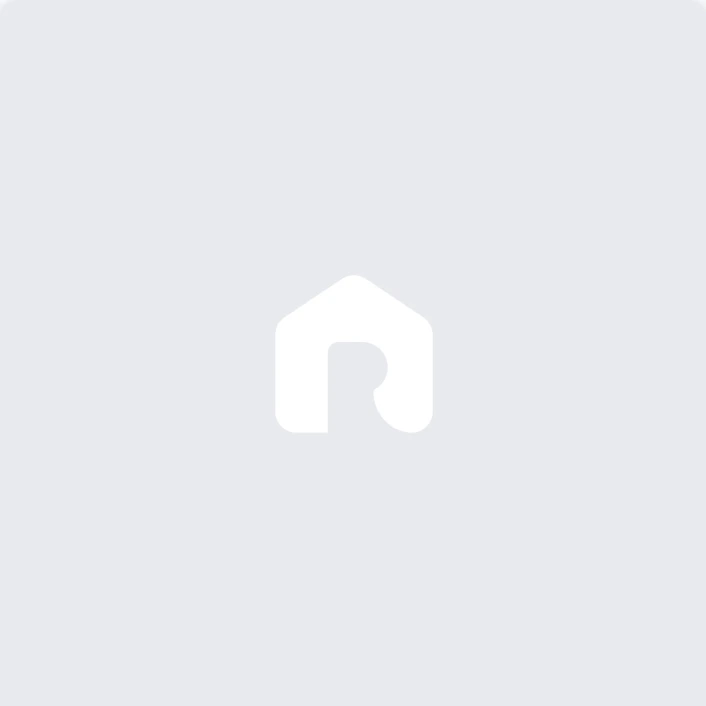

In [109]:
soup = BeautifulSoup(response.content)
soup

In [110]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
sydney = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(sydney)

                                                  City  \
0                    Millers Point NSW 2000, Australia   
1                   Berowra Waters NSW 2082, Australia   
2    SEA LIFE Sydney Aquarium, King Street Offramp,...   
3    Centennial Park, Centennial Park NSW 2021, Aus...   
4                       Palm Beach NSW 2108, Australia   
..                                                 ...   
795  City of Parramatta Council, New South Wales, A...   
796                       Tamarama NSW 2026, Australia   
797                        Redfern NSW 2016, Australia   
798                 Wentworthville NSW 2145, Australia   
799                 Sydney, New South Wales, Australia   

                                            State_code  \
0                    Millers Point NSW 2000, Australia   
1                   Berowra Waters NSW 2082, Australia   
2    SEA LIFE Sydney Aquarium, King Street Offramp,...   
3    Centennial Park, Centennial Park NSW 2021, Aus...   
4            

In [111]:
sydney.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Millers Point NSW 2000, Australia","Millers Point NSW 2000, Australia","Millers Point NSW 2000, Australia","$19,307",No,926 Sq Ft,1,2,"Millers Point NSW 2000, Australia","$19,307",No,No,No,No,Yes,No,No,No
1,"Berowra Waters NSW 2082, Australia","Berowra Waters NSW 2082, Australia","Berowra Waters NSW 2082, Australia","$22,829",No,6458 Sq Ft,3,4,"Berowra Waters NSW 2082, Australia","$22,829",No,No,Yes,Yes,Yes,No,No,No
2,"SEA LIFE Sydney Aquarium, King Street Offramp,...","SEA LIFE Sydney Aquarium, King Street Offramp,...","SEA LIFE Sydney Aquarium, King Street Offramp,...","$19,816",No,2368 Sq Ft,2,3,"SEA LIFE Sydney Aquarium, King Street Offramp,...","$19,816",No,No,Yes,Yes,Yes,No,No,No
3,"Centennial Park, Centennial Park NSW 2021, Aus...","Centennial Park, Centennial Park NSW 2021, Aus...","Centennial Park, Centennial Park NSW 2021, Aus...","$16,676",No,udio,t,S,"Centennial Park, Centennial Park NSW 2021, Aus...","$16,676",No,No,Yes,No,Yes,No,No,No
4,"Palm Beach NSW 2108, Australia","Palm Beach NSW 2108, Australia","Palm Beach NSW 2108, Australia","$54,780",No,,4,5,"Palm Beach NSW 2108, Australia","$54,780",No,No,No,No,No,No,No,No


In [ ]:
#len(City),len(State_code),len(Country),len( Deposit),len(Pets_allowed),len(Area),len(no_of_Bathroom),
#len(no_of_Bedroom),len(Address),len(Rental_price),len(Washer_Dryer),len(Air_conditioning),len(Parking),len(Fireplace),
#len(Dishwasher),len(Hardwood_Floors),len(Roofdeck),len(Roofdeck)

In [114]:
sydney=sydney.assign(SNo=range(len(sydney)))
titles=list(sydney.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
sydney=sydney[titles]
sydney.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Millers Point NSW 2000, Australia","Millers Point NSW 2000, Australia","$19,307",No,926 Sq Ft,1,2,"Millers Point NSW 2000, Australia","$19,307",No,No,No,No,Yes,No,No,No,"Millers Point NSW 2000, Australia"
1,1,"Berowra Waters NSW 2082, Australia","Berowra Waters NSW 2082, Australia","$22,829",No,6458 Sq Ft,3,4,"Berowra Waters NSW 2082, Australia","$22,829",No,No,Yes,Yes,Yes,No,No,No,"Berowra Waters NSW 2082, Australia"
2,2,"SEA LIFE Sydney Aquarium, King Street Offramp,...","SEA LIFE Sydney Aquarium, King Street Offramp,...","$19,816",No,2368 Sq Ft,2,3,"SEA LIFE Sydney Aquarium, King Street Offramp,...","$19,816",No,No,Yes,Yes,Yes,No,No,No,"SEA LIFE Sydney Aquarium, King Street Offramp,..."
3,3,"Centennial Park, Centennial Park NSW 2021, Aus...","Centennial Park, Centennial Park NSW 2021, Aus...","$16,676",No,udio,t,S,"Centennial Park, Centennial Park NSW 2021, Aus...","$16,676",No,No,Yes,No,Yes,No,No,No,"Centennial Park, Centennial Park NSW 2021, Aus..."
4,4,"Palm Beach NSW 2108, Australia","Palm Beach NSW 2108, Australia","$54,780",No,,4,5,"Palm Beach NSW 2108, Australia","$54,780",No,No,No,No,No,No,No,No,"Palm Beach NSW 2108, Australia"


In [ ]:
#tokyo

In [115]:
url = "https://rentberry.com/apartments/s/tokyo"

In [116]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [117]:

response = requests.get(url, headers=headers)

In [118]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
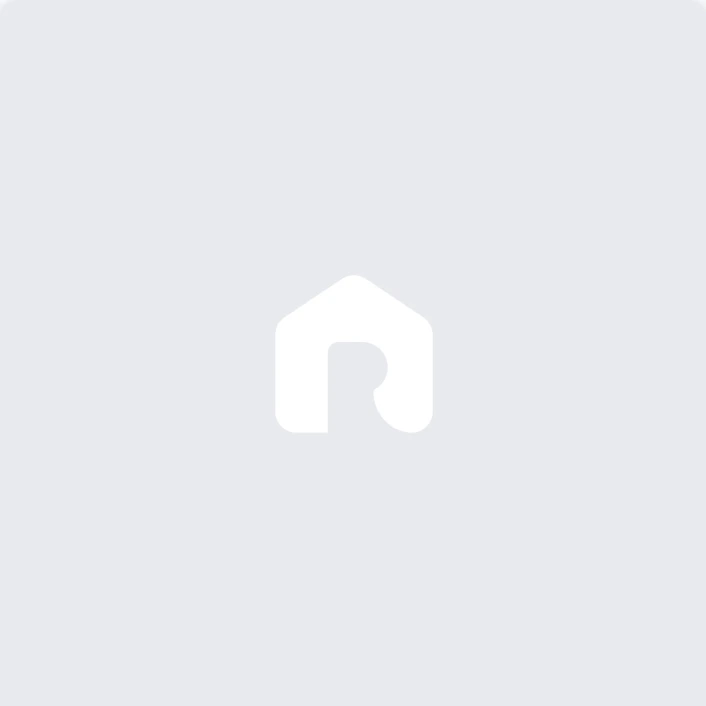

In [119]:
soup = BeautifulSoup(response.content)
soup

In [120]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
tokyo = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(tokyo)

                                                  City  \
0             Soka, Saitama Prefecture 340-0031, Japan   
1                 Koshigaya, Saitama Prefecture, Japan   
2                                          Chuo, Japan   
3                                       Edogawa, Japan   
4                                       Shibuya, Japan   
..                                                 ...   
795               Yokosuka, Kanagawa Prefecture, Japan   
796  Naka Ward, Yokohama, Kanagawa Prefecture 231-0...   
797                                    Setagaya, Japan   
798                                  Katsushika, Japan   
799                          Shinjuku, 169-0072, Japan   

                                            State_code  \
0             Soka, Saitama Prefecture 340-0031, Japan   
1                 Koshigaya, Saitama Prefecture, Japan   
2                                          Chuo, Japan   
3                                       Edogawa, Japan   
4            

In [121]:
tokyo.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Soka, Saitama Prefecture 340-0031, Japan","Soka, Saitama Prefecture 340-0031, Japan","Soka, Saitama Prefecture 340-0031, Japan","¥891,065",No,1292 Sq Ft,1,5,"Soka, Saitama Prefecture 340-0031, Japan","¥891,065",No,No,Yes,No,Yes,No,No,No
1,"Koshigaya, Saitama Prefecture, Japan","Koshigaya, Saitama Prefecture, Japan","Koshigaya, Saitama Prefecture, Japan","¥685,435",No,226 Sq Ft,1,1,"Koshigaya, Saitama Prefecture, Japan","¥685,435",No,No,Yes,No,No,No,No,No
2,"Chuo, Japan","Chuo, Japan","Chuo, Japan","¥1,05M",No,431 Sq Ft,1,1,"Chuo, Japan","¥1,05M",No,No,No,No,No,No,No,No
3,"Edogawa, Japan","Edogawa, Japan","Edogawa, Japan","¥290,302",No,248 Sq Ft,1,1,"Edogawa, Japan","¥290,302",No,No,No,No,No,No,No,No
4,"Shibuya, Japan","Shibuya, Japan","Shibuya, Japan","¥1,13M",No,807 Sq Ft,1,2,"Shibuya, Japan","¥1,13M",No,No,No,No,No,No,No,No


In [122]:
tokyo=tokyo.assign(SNo=range(len(tokyo)))
titles=list(tokyo.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
tokyo=tokyo[titles]
tokyo.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Soka, Saitama Prefecture 340-0031, Japan","Soka, Saitama Prefecture 340-0031, Japan","¥891,065",No,1292 Sq Ft,1,5,"Soka, Saitama Prefecture 340-0031, Japan","¥891,065",No,No,Yes,No,Yes,No,No,No,"Soka, Saitama Prefecture 340-0031, Japan"
1,1,"Koshigaya, Saitama Prefecture, Japan","Koshigaya, Saitama Prefecture, Japan","¥685,435",No,226 Sq Ft,1,1,"Koshigaya, Saitama Prefecture, Japan","¥685,435",No,No,Yes,No,No,No,No,No,"Koshigaya, Saitama Prefecture, Japan"
2,2,"Chuo, Japan","Chuo, Japan","¥1,05M",No,431 Sq Ft,1,1,"Chuo, Japan","¥1,05M",No,No,No,No,No,No,No,No,"Chuo, Japan"
3,3,"Edogawa, Japan","Edogawa, Japan","¥290,302",No,248 Sq Ft,1,1,"Edogawa, Japan","¥290,302",No,No,No,No,No,No,No,No,"Edogawa, Japan"
4,4,"Shibuya, Japan","Shibuya, Japan","¥1,13M",No,807 Sq Ft,1,2,"Shibuya, Japan","¥1,13M",No,No,No,No,No,No,No,No,"Shibuya, Japan"


In [143]:
#perth

In [123]:
url = "https://rentberry.com/apartments/s/perth"

In [124]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [125]:

response = requests.get(url, headers=headers)

In [126]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
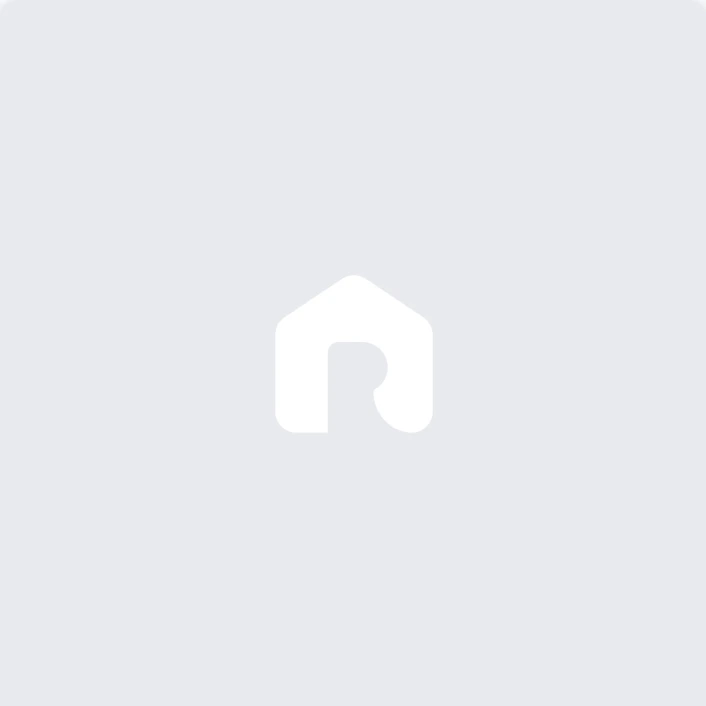

In [127]:
soup = BeautifulSoup(response.content)
soup

In [128]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
perth = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(perth)

                                                  City  \
0                       South Perth WA 6151, Australia   
1                          Baldivis WA 6171, Australia   
2    Innaloo, City Of Stirling, Western Australia, ...   
3                           Kewdale WA 6105, Australia   
4    Warnbro, City Of Rockingham, Western Australia...   
..                                                 ...   
795            Fremantle, City of Fremantle, Australia   
796                      Rockingham WA 6168, Australia   
797                      Applecross WA 6153, Australia   
798                     Northbridge WA 6003, Australia   
799                     Scarborough WA 6019, Australia   

                                            State_code  \
0                       South Perth WA 6151, Australia   
1                          Baldivis WA 6171, Australia   
2    Innaloo, City Of Stirling, Western Australia, ...   
3                           Kewdale WA 6105, Australia   
4    Warnbro,

In [129]:
perth.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"South Perth WA 6151, Australia","South Perth WA 6151, Australia","South Perth WA 6151, Australia","$6,874",No,,1,1,"South Perth WA 6151, Australia","$6,874",No,No,Yes,No,Yes,No,No,No
1,"Baldivis WA 6171, Australia","Baldivis WA 6171, Australia","Baldivis WA 6171, Australia","$5,219",No,646 Sq Ft,1,1,"Baldivis WA 6171, Australia","$5,219",No,No,Yes,No,No,No,No,No
2,"Innaloo, City Of Stirling, Western Australia, ...","Innaloo, City Of Stirling, Western Australia, ...","Innaloo, City Of Stirling, Western Australia, ...","$6,068",No,517 Sq Ft,2,3,"Innaloo, City Of Stirling, Western Australia, ...","$6,068",No,No,Yes,No,Yes,No,No,No
3,"Kewdale WA 6105, Australia","Kewdale WA 6105, Australia","Kewdale WA 6105, Australia","$11,499",No,2034 Sq Ft,2,4,"Kewdale WA 6105, Australia","$11,499",No,No,Yes,No,Yes,No,No,No
4,"Warnbro, City Of Rockingham, Western Australia...","Warnbro, City Of Rockingham, Western Australia...","Warnbro, City Of Rockingham, Western Australia...","$2,716",No,,1,1,"Warnbro, City Of Rockingham, Western Australia...","$2,716",No,No,Yes,No,No,No,No,No


In [130]:
perth=perth.assign(SNo=range(len(perth)))
titles=list(perth.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
perth=perth[titles]
perth.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"South Perth WA 6151, Australia","South Perth WA 6151, Australia","$6,874",No,,1,1,"South Perth WA 6151, Australia","$6,874",No,No,Yes,No,Yes,No,No,No,"South Perth WA 6151, Australia"
1,1,"Baldivis WA 6171, Australia","Baldivis WA 6171, Australia","$5,219",No,646 Sq Ft,1,1,"Baldivis WA 6171, Australia","$5,219",No,No,Yes,No,No,No,No,No,"Baldivis WA 6171, Australia"
2,2,"Innaloo, City Of Stirling, Western Australia, ...","Innaloo, City Of Stirling, Western Australia, ...","$6,068",No,517 Sq Ft,2,3,"Innaloo, City Of Stirling, Western Australia, ...","$6,068",No,No,Yes,No,Yes,No,No,No,"Innaloo, City Of Stirling, Western Australia, ..."
3,3,"Kewdale WA 6105, Australia","Kewdale WA 6105, Australia","$11,499",No,2034 Sq Ft,2,4,"Kewdale WA 6105, Australia","$11,499",No,No,Yes,No,Yes,No,No,No,"Kewdale WA 6105, Australia"
4,4,"Warnbro, City Of Rockingham, Western Australia...","Warnbro, City Of Rockingham, Western Australia...","$2,716",No,,1,1,"Warnbro, City Of Rockingham, Western Australia...","$2,716",No,No,Yes,No,No,No,No,No,"Warnbro, City Of Rockingham, Western Australia..."


In [146]:
#amsterdam

In [131]:
url = "https://rentberry.com/apartments/s/amsterdam"

In [132]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [133]:

response = requests.get(url, headers=headers)

In [134]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
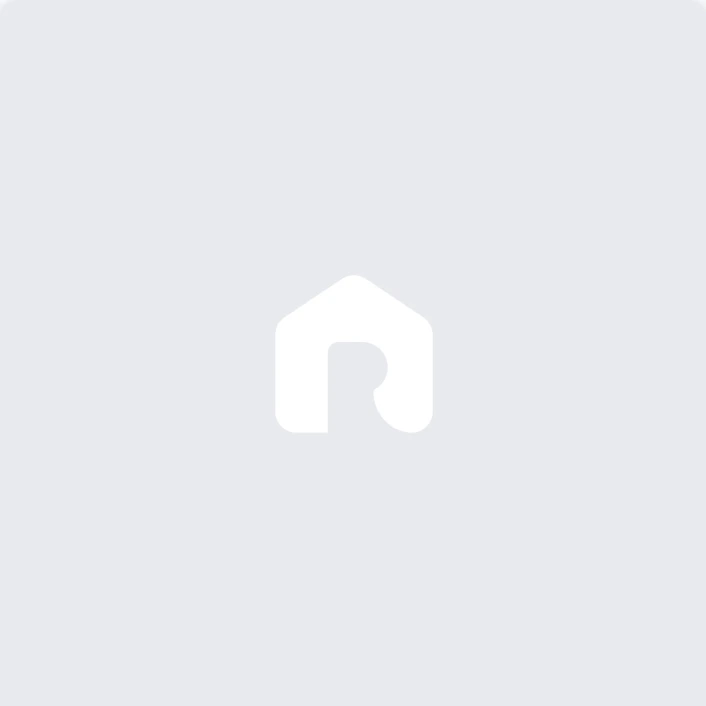

In [135]:
soup = BeautifulSoup(response.content)
soup

In [136]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
amsterdam = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(amsterdam)

                                                  City  \
0    Michelangelostraat 54, 1077 Amsterdam, Netherl...   
1     Carnapstraat 226, 1062 KT Amsterdam, Netherlands   
2    Red Light District, Bethaniënstraat, 1012 CA A...   
3    Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...   
4                       1075 XL Amsterdam, Netherlands   
..                                                 ...   
795     Meidoornweg, 1171 JW Badhoevedorp, Netherlands   
796  Bos en Vaartlaan, 1181 AA Amstelveen, Netherlands   
797                  1115 XC Duivendrecht, Netherlands   
798  Red Light District, Koestraat, 1012 BW Amsterd...   
799       Bijlmerdreef, 1102 BC Amsterdam, Netherlands   

                                            State_code  \
0    Michelangelostraat 54, 1077 Amsterdam, Netherl...   
1     Carnapstraat 226, 1062 KT Amsterdam, Netherlands   
2    Red Light District, Bethaniënstraat, 1012 CA A...   
3    Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...   
4            

In [137]:
amsterdam.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Michelangelostraat 54, 1077 Amsterdam, Netherl...","Michelangelostraat 54, 1077 Amsterdam, Netherl...","Michelangelostraat 54, 1077 Amsterdam, Netherl...","€2,290",No,212 m2,4,4,"Michelangelostraat 54, 1077 Amsterdam, Netherl...","€2,290",No,No,No,No,Yes,No,No,Yes
1,"Carnapstraat 226, 1062 KT Amsterdam, Netherlands","Carnapstraat 226, 1062 KT Amsterdam, Netherlands","Carnapstraat 226, 1062 KT Amsterdam, Netherlands",€700,No,147 m2,1,4,"Carnapstraat 226, 1062 KT Amsterdam, Netherlands",€700,No,No,No,No,No,No,No,No
2,"Red Light District, Bethaniënstraat, 1012 CA A...","Red Light District, Bethaniënstraat, 1012 CA A...","Red Light District, Bethaniënstraat, 1012 CA A...","€2,600",No,55 m2,1,2,"Red Light District, Bethaniënstraat, 1012 CA A...","€2,600",No,No,Yes,No,No,No,No,No
3,"Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...","Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...","Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...",€607,No,91 m2,1,3,"Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...",€607,No,No,No,No,No,No,No,No
4,"1075 XL Amsterdam, Netherlands","1075 XL Amsterdam, Netherlands","1075 XL Amsterdam, Netherlands","€7,359",No,646 Sq Ft,2,2,"1075 XL Amsterdam, Netherlands","€7,359",No,No,Yes,No,No,No,No,No


In [138]:
amsterdam=amsterdam.assign(SNo=range(len(amsterdam)))
titles=list(amsterdam.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
amsterdam=amsterdam[titles]
amsterdam.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Michelangelostraat 54, 1077 Amsterdam, Netherl...","Michelangelostraat 54, 1077 Amsterdam, Netherl...","€2,290",No,212 m2,4,4,"Michelangelostraat 54, 1077 Amsterdam, Netherl...","€2,290",No,No,No,No,Yes,No,No,Yes,"Michelangelostraat 54, 1077 Amsterdam, Netherl..."
1,1,"Carnapstraat 226, 1062 KT Amsterdam, Netherlands","Carnapstraat 226, 1062 KT Amsterdam, Netherlands",€700,No,147 m2,1,4,"Carnapstraat 226, 1062 KT Amsterdam, Netherlands",€700,No,No,No,No,No,No,No,No,"Carnapstraat 226, 1062 KT Amsterdam, Netherlands"
2,2,"Red Light District, Bethaniënstraat, 1012 CA A...","Red Light District, Bethaniënstraat, 1012 CA A...","€2,600",No,55 m2,1,2,"Red Light District, Bethaniënstraat, 1012 CA A...","€2,600",No,No,Yes,No,No,No,No,No,"Red Light District, Bethaniënstraat, 1012 CA A..."
3,3,"Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...","Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...",€607,No,91 m2,1,3,"Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl...",€607,No,No,No,No,No,No,No,No,"Gerrit Rietveldsingel, 1112 ZB Diemen, Netherl..."
4,4,"1075 XL Amsterdam, Netherlands","1075 XL Amsterdam, Netherlands","€7,359",No,646 Sq Ft,2,2,"1075 XL Amsterdam, Netherlands","€7,359",No,No,Yes,No,No,No,No,No,"1075 XL Amsterdam, Netherlands"


In [ ]:
#birmingham

In [139]:
url = "https://rentberry.com/apartments/s/birmingham"

In [140]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [141]:

response = requests.get(url, headers=headers)

In [142]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
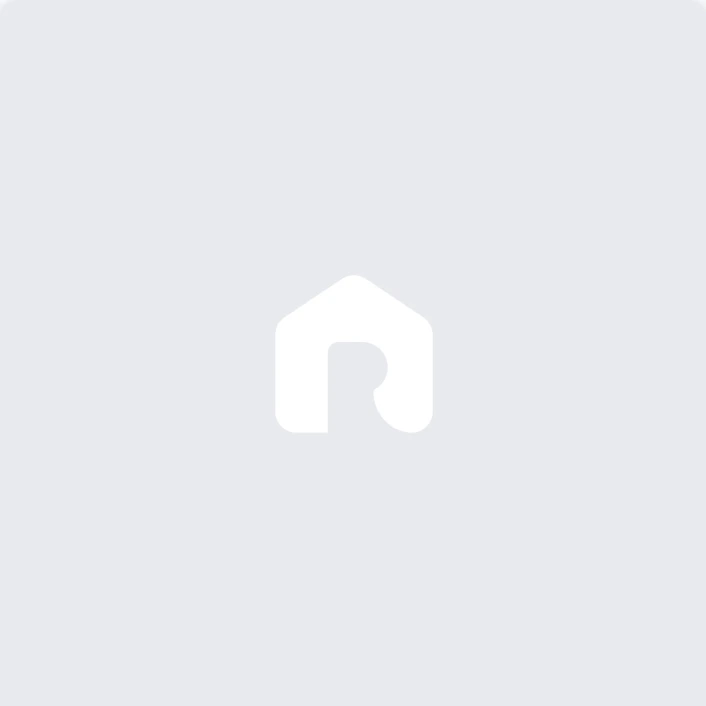

In [143]:
soup = BeautifulSoup(response.content)
soup

In [144]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
birmingham = pd.DataFrame({
    'City': City[0:600],
    'State_code':State_code[0:600],
    'Country':Country[0:600],
    'Deposit': Deposit[0:600],
    'Pets_allowed':Pets_allowed[0:600],
    'Area': Area[0:600],
    'no_of_Bathroom': no_of_Bathroom[0:600],
    'no_of_Bedroom': no_of_Bedroom[0:600],
    'Address': Address[0:600],
    'Rental_price': Rental_price[0:600],
    'Washer_Dryer': Washer_Dryer[0:600],
    'Air_conditioning ': Air_conditioning[0:600],
    'Parking': Parking[0:600],
    'Fireplace': Fireplace[0:600],
    'Dishwasher': Dishwasher[0:600],
    'Hardwood_Floors': Hardwood_Floors[0:600],
    'Roofdeck': Roofdeck[0:600],
    'Storage': Storage[0:600]
   
})

# Display DataFrame
print(birmingham)

                                                  City  \
0    90 Heeley Road, Selly Oak, B29 6EZ, United Kin...   
1    10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...   
2    CC Kat Aesthetics, Sherborne Street, Park Cent...   
3    252 Hubert Road, Selly Oak, B29 6EP, United Ki...   
4    11 Arley Road, Selly Oak, B29 7BQ, United Kingdom   
..                                                 ...   
595  Gilldown Place, Park Central, B15 2LR, United ...   
596  137 Heeley Road, Selly Oak, B29 6EJ, United Ki...   
597  55, 57 Teddington Grove, Perry Barr, B42 1RG, ...   
598  19 Ten Acres Mews, Stirchley, B30 2BF, United ...   
599  214 Heeley Road, Selly Oak, B29 6EN, United Ki...   

                                            State_code  \
0    90 Heeley Road, Selly Oak, B29 6EZ, United Kin...   
1    10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...   
2    CC Kat Aesthetics, Sherborne Street, Park Cent...   
3    252 Hubert Road, Selly Oak, B29 6EP, United Ki...   
4    11 Arley

In [ ]:
len(City),len(State_code),len(Country),len( Deposit),len(Pets_allowed),len(Area),len(no_of_Bathroom),
#len(no_of_Bedroom),len(Address),len(Rental_price),len(Washer_Dryer),len(Air_conditioning),len(Parking),len(Fireplace),
#len(Dishwasher),len(Hardwood_Floors),len(Roofdeck),len(Roofdeck)

In [145]:
birmingham.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"90 Heeley Road, Selly Oak, B29 6EZ, United Kin...","90 Heeley Road, Selly Oak, B29 6EZ, United Kin...","90 Heeley Road, Selly Oak, B29 6EZ, United Kin...","£3,354",No,,6,6,"90 Heeley Road, Selly Oak, B29 6EZ, United Kin...","£3,354",No,No,No,No,No,No,No,No
1,"10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...","10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...","10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...","£2,600",No,,2,4,"10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...","£2,600",No,No,No,No,No,No,No,No
2,"CC Kat Aesthetics, Sherborne Street, Park Cent...","CC Kat Aesthetics, Sherborne Street, Park Cent...","CC Kat Aesthetics, Sherborne Street, Park Cent...","£1,175",No,,2,2,"CC Kat Aesthetics, Sherborne Street, Park Cent...","£1,175",No,No,No,No,No,No,No,No
3,"252 Hubert Road, Selly Oak, B29 6EP, United Ki...","252 Hubert Road, Selly Oak, B29 6EP, United Ki...","252 Hubert Road, Selly Oak, B29 6EP, United Ki...",£464,No,,6,6,"252 Hubert Road, Selly Oak, B29 6EP, United Ki...",£464,No,No,No,No,No,No,No,No
4,"11 Arley Road, Selly Oak, B29 7BQ, United Kingdom","11 Arley Road, Selly Oak, B29 7BQ, United Kingdom","11 Arley Road, Selly Oak, B29 7BQ, United Kingdom","£2,492",No,,3,5,"11 Arley Road, Selly Oak, B29 7BQ, United Kingdom","£2,492",No,No,No,No,No,No,No,No


In [146]:
birmingham=birmingham.assign(SNo=range(len(birmingham)))
titles=list(birmingham.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
birmingham=birmingham[titles]
birmingham.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"90 Heeley Road, Selly Oak, B29 6EZ, United Kin...","90 Heeley Road, Selly Oak, B29 6EZ, United Kin...","£3,354",No,,6,6,"90 Heeley Road, Selly Oak, B29 6EZ, United Kin...","£3,354",No,No,No,No,No,No,No,No,"90 Heeley Road, Selly Oak, B29 6EZ, United Kin..."
1,1,"10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...","10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...","£2,600",No,,2,4,"10 Kenneggy Mews, Selly Oak, B29 7AQ, United K...","£2,600",No,No,No,No,No,No,No,No,"10 Kenneggy Mews, Selly Oak, B29 7AQ, United K..."
2,2,"CC Kat Aesthetics, Sherborne Street, Park Cent...","CC Kat Aesthetics, Sherborne Street, Park Cent...","£1,175",No,,2,2,"CC Kat Aesthetics, Sherborne Street, Park Cent...","£1,175",No,No,No,No,No,No,No,No,"CC Kat Aesthetics, Sherborne Street, Park Cent..."
3,3,"252 Hubert Road, Selly Oak, B29 6EP, United Ki...","252 Hubert Road, Selly Oak, B29 6EP, United Ki...",£464,No,,6,6,"252 Hubert Road, Selly Oak, B29 6EP, United Ki...",£464,No,No,No,No,No,No,No,No,"252 Hubert Road, Selly Oak, B29 6EP, United Ki..."
4,4,"11 Arley Road, Selly Oak, B29 7BQ, United Kingdom","11 Arley Road, Selly Oak, B29 7BQ, United Kingdom","£2,492",No,,3,5,"11 Arley Road, Selly Oak, B29 7BQ, United Kingdom","£2,492",No,No,No,No,No,No,No,No,"11 Arley Road, Selly Oak, B29 7BQ, United Kingdom"


In [ ]:
#glasgow

In [147]:
url = "https://rentberry.com/apartments/s/glasgow"

In [148]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [149]:

response = requests.get(url, headers=headers)

In [150]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
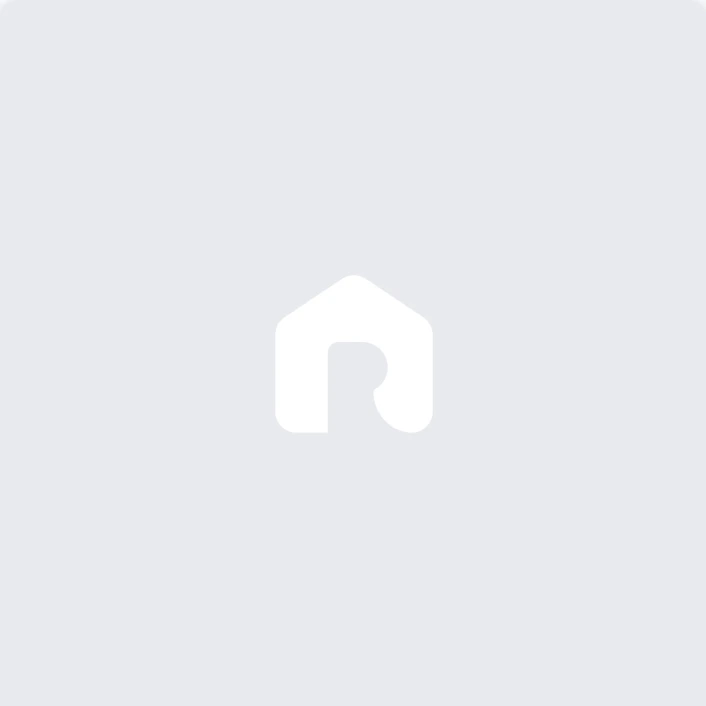

In [151]:
soup = BeautifulSoup(response.content)
soup

In [152]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
glasgow = pd.DataFrame({
    'City': City[0:600],
    'State_code':State_code[0:600],
    'Country':Country[0:600],
    'Deposit': Deposit[0:600],
    'Pets_allowed':Pets_allowed[0:600],
    'Area': Area[0:600],
    'no_of_Bathroom': no_of_Bathroom[0:600],
    'no_of_Bedroom': no_of_Bedroom[0:600],
    'Address': Address[0:600],
    'Rental_price': Rental_price[0:600],
    'Washer_Dryer': Washer_Dryer[0:600],
    'Air_conditioning ': Air_conditioning[0:600],
    'Parking': Parking[0:600],
    'Fireplace': Fireplace[0:600],
    'Dishwasher': Dishwasher[0:600],
    'Hardwood_Floors': Hardwood_Floors[0:600],
    'Roofdeck': Roofdeck[0:600],
    'Storage': Storage[0:600]
   
})

# Display DataFrame
print(glasgow)

                                                  City  \
0    89 Hyndland Road, Partickhill, Glasgow, G12 9J...   
1    Glasgow University Willowbank Community Garden...   
2    3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...   
3    The Griffin, 266 Bath Street, Glasgow, G2 4JP,...   
4    Colgrave Crescent, Glasgow, G32 8PJ, United Ki...   
..                                                 ...   
595  Great George Lane, North Kelvinside, Glasgow, ...   
596  48 Clarendon Place, Glasgow, G20 7PZ, United K...   
597  Glenmuir Drive, Househillwood, Glasgow, G53 6N...   
598  Lifestyle Express, 45 Old Dumbarton Road, Glas...   
599  Bridgeburn Drive, Moodiesburn, G69 0AU, United...   

                                            State_code  \
0    89 Hyndland Road, Partickhill, Glasgow, G12 9J...   
1    Glasgow University Willowbank Community Garden...   
2    3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...   
3    The Griffin, 266 Bath Street, Glasgow, G2 4JP,...   
4    Colgrave

In [ ]:
len(City),len(State_code),len(Country),len( Deposit),len(Pets_allowed),len(Area),len(no_of_Bathroom),
#len(no_of_Bedroom),len(Address),len(Rental_price),len(Washer_Dryer),len(Air_conditioning),len(Parking),len(Fireplace),
#len(Dishwasher),len(Hardwood_Floors),len(Roofdeck),len(Roofdeck)

In [153]:
glasgow.head(150)

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"89 Hyndland Road, Partickhill, Glasgow, G12 9J...","89 Hyndland Road, Partickhill, Glasgow, G12 9J...","89 Hyndland Road, Partickhill, Glasgow, G12 9J...","£1,950",No,,2,3,"89 Hyndland Road, Partickhill, Glasgow, G12 9J...","£1,950",No,No,No,No,No,No,No,No
1,Glasgow University Willowbank Community Garden...,Glasgow University Willowbank Community Garden...,Glasgow University Willowbank Community Garden...,"£4,004",No,65 m2,1,3,Glasgow University Willowbank Community Garden...,"£4,004",No,No,Yes,No,Yes,No,No,Yes
2,"3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...","3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...","3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...","£2,995",No,,2,4,"3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...","£2,995",No,No,No,No,No,No,No,No
3,"The Griffin, 266 Bath Street, Glasgow, G2 4JP,...","The Griffin, 266 Bath Street, Glasgow, G2 4JP,...","The Griffin, 266 Bath Street, Glasgow, G2 4JP,...",£950,No,,1,1,"The Griffin, 266 Bath Street, Glasgow, G2 4JP,...",£950,No,No,No,No,No,No,No,No
4,"Colgrave Crescent, Glasgow, G32 8PJ, United Ki...","Colgrave Crescent, Glasgow, G32 8PJ, United Ki...","Colgrave Crescent, Glasgow, G32 8PJ, United Ki...",£995,No,,1,2,"Colgrave Crescent, Glasgow, G32 8PJ, United Ki...",£995,No,No,No,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,"O2 ABC Glasgow, 300 Sauchiehall Street, Glasgo...","O2 ABC Glasgow, 300 Sauchiehall Street, Glasgo...","O2 ABC Glasgow, 300 Sauchiehall Street, Glasgo...",£795,No,,1,1,"O2 ABC Glasgow, 300 Sauchiehall Street, Glasgo...",£795,No,No,No,No,No,No,No,No
146,"unnamed road, Glasgow, G3 6JR, United Kingdom","unnamed road, Glasgow, G3 6JR, United Kingdom","unnamed road, Glasgow, G3 6JR, United Kingdom","£1,050",No,,1,2,"unnamed road, Glasgow, G3 6JR, United Kingdom","£1,050",No,No,No,No,No,No,No,No
147,"Merchant Pride, 20 Candleriggs, Laurieston, Gl...","Merchant Pride, 20 Candleriggs, Laurieston, Gl...","Merchant Pride, 20 Candleriggs, Laurieston, Gl...","£1,067",No,,2,1,"Merchant Pride, 20 Candleriggs, Laurieston, Gl...","£1,067",No,No,No,No,No,No,No,No
148,"Hamilton Road, Rutherglen, G73 3DF, United Kin...","Hamilton Road, Rutherglen, G73 3DF, United Kin...","Hamilton Road, Rutherglen, G73 3DF, United Kin...",£625,No,,2,1,"Hamilton Road, Rutherglen, G73 3DF, United Kin...",£625,No,No,No,No,No,No,No,No


In [154]:
glasgow=glasgow.assign(SNo=range(len(glasgow)))
titles=list(glasgow.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
glasgow=glasgow[titles]
glasgow.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"89 Hyndland Road, Partickhill, Glasgow, G12 9J...","89 Hyndland Road, Partickhill, Glasgow, G12 9J...","£1,950",No,,2,3,"89 Hyndland Road, Partickhill, Glasgow, G12 9J...","£1,950",No,No,No,No,No,No,No,No,"89 Hyndland Road, Partickhill, Glasgow, G12 9J..."
1,1,Glasgow University Willowbank Community Garden...,Glasgow University Willowbank Community Garden...,"£4,004",No,65 m2,1,3,Glasgow University Willowbank Community Garden...,"£4,004",No,No,Yes,No,Yes,No,No,Yes,Glasgow University Willowbank Community Garden...
2,2,"3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...","3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...","£2,995",No,,2,4,"3-5 Merrylee Road, New Cathcart, Glasgow, G43 ...","£2,995",No,No,No,No,No,No,No,No,"3-5 Merrylee Road, New Cathcart, Glasgow, G43 ..."
3,3,"The Griffin, 266 Bath Street, Glasgow, G2 4JP,...","The Griffin, 266 Bath Street, Glasgow, G2 4JP,...",£950,No,,1,1,"The Griffin, 266 Bath Street, Glasgow, G2 4JP,...",£950,No,No,No,No,No,No,No,No,"The Griffin, 266 Bath Street, Glasgow, G2 4JP,..."
4,4,"Colgrave Crescent, Glasgow, G32 8PJ, United Ki...","Colgrave Crescent, Glasgow, G32 8PJ, United Ki...",£995,No,,1,2,"Colgrave Crescent, Glasgow, G32 8PJ, United Ki...",£995,No,No,No,No,No,No,No,No,"Colgrave Crescent, Glasgow, G32 8PJ, United Ki..."


In [ ]:
#frankfurt

In [155]:
url = "https://rentberry.com/apartments/s/frankfurt-am-main"

In [156]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [157]:

response = requests.get(url, headers=headers)

In [158]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
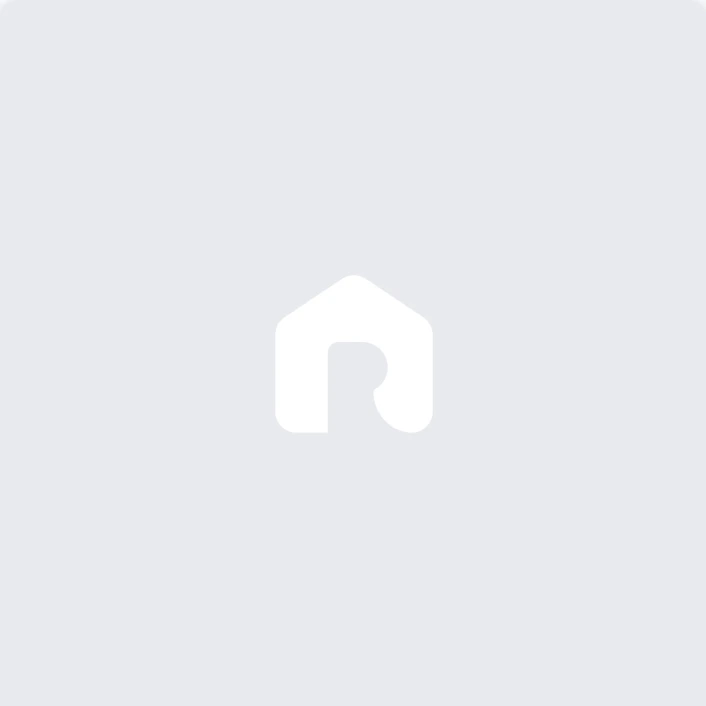

In [159]:
soup = BeautifulSoup(response.content)
soup

In [160]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
frankfurt = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(frankfurt)

                                                  City  \
0    Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...   
1        Liebfrauenstraße 20, 61440 Oberursel, Germany   
2     Gref-Völsing-Straße 15, 60314 Frankfurt, Germany   
3       Martin-May-Straße 18, 60594 Frankfurt, Germany   
4           Mergenthalerallee, 65760 Eschborn, Germany   
..                                                 ...   
795           Oberlindau 108, 60322 Frankfurt, Germany   
796  Wilhelm-Leuschner-Straße 34, 60329 Frankfurt, ...   
797     Trakehner Straße 7-9, 60487 Frankfurt, Germany   
798  Oppenheimer Straße 20-24, 60594 Frankfurt, Ger...   
799   Mainzer Landstraße 395, 60326 Frankfurt, Germany   

                                            State_code  \
0    Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...   
1        Liebfrauenstraße 20, 61440 Oberursel, Germany   
2     Gref-Völsing-Straße 15, 60314 Frankfurt, Germany   
3       Martin-May-Straße 18, 60594 Frankfurt, Germany   
4           M

In [ ]:
#len(City),len(State_code),len(Country),len( Deposit),len(Pets_allowed),len(Area),len(no_of_Bathroom),
#len(no_of_Bedroom),len(Address),len(Rental_price),len(Washer_Dryer),len(Air_conditioning),len(Parking),len(Fireplace),
len(Dishwasher),len(Hardwood_Floors),len(Roofdeck),len(Roofdeck)

In [161]:
frankfurt.head()

,City,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage
0,"Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...","Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...","Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...","€1,611",No,udio143 m2,t,S,"Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...","€1,611",No,No,No,No,Yes,No,No,Yes
1,"Liebfrauenstraße 20, 61440 Oberursel, Germany","Liebfrauenstraße 20, 61440 Oberursel, Germany","Liebfrauenstraße 20, 61440 Oberursel, Germany","€1,124",No,udio123 m2,t,S,"Liebfrauenstraße 20, 61440 Oberursel, Germany","€1,124",No,No,No,No,No,No,No,Yes
2,"Gref-Völsing-Straße 15, 60314 Frankfurt, Germany","Gref-Völsing-Straße 15, 60314 Frankfurt, Germany","Gref-Völsing-Straße 15, 60314 Frankfurt, Germany",€745,No,,1,2,"Gref-Völsing-Straße 15, 60314 Frankfurt, Germany",€745,No,No,No,No,No,No,No,No
3,"Martin-May-Straße 18, 60594 Frankfurt, Germany","Martin-May-Straße 18, 60594 Frankfurt, Germany","Martin-May-Straße 18, 60594 Frankfurt, Germany","€1,300",No,udio124 m2,t,S,"Martin-May-Straße 18, 60594 Frankfurt, Germany","€1,300",No,No,No,No,No,No,No,No
4,"Mergenthalerallee, 65760 Eschborn, Germany","Mergenthalerallee, 65760 Eschborn, Germany","Mergenthalerallee, 65760 Eschborn, Germany","€1,348",No,udio124 m2,t,S,"Mergenthalerallee, 65760 Eschborn, Germany","€1,348",No,No,Yes,No,No,No,No,No


In [162]:
frankfurt=frankfurt.assign(SNo=range(len(frankfurt)))
titles=list(frankfurt.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]
frankfurt=frankfurt[titles]
frankfurt.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...","Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...","€1,611",No,udio143 m2,t,S,"Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,...","€1,611",No,No,No,No,Yes,No,No,Yes,"Amelia-Mary-Earhart-Straße 5, 60549 Frankfurt,..."
1,1,"Liebfrauenstraße 20, 61440 Oberursel, Germany","Liebfrauenstraße 20, 61440 Oberursel, Germany","€1,124",No,udio123 m2,t,S,"Liebfrauenstraße 20, 61440 Oberursel, Germany","€1,124",No,No,No,No,No,No,No,Yes,"Liebfrauenstraße 20, 61440 Oberursel, Germany"
2,2,"Gref-Völsing-Straße 15, 60314 Frankfurt, Germany","Gref-Völsing-Straße 15, 60314 Frankfurt, Germany",€745,No,,1,2,"Gref-Völsing-Straße 15, 60314 Frankfurt, Germany",€745,No,No,No,No,No,No,No,No,"Gref-Völsing-Straße 15, 60314 Frankfurt, Germany"
3,3,"Martin-May-Straße 18, 60594 Frankfurt, Germany","Martin-May-Straße 18, 60594 Frankfurt, Germany","€1,300",No,udio124 m2,t,S,"Martin-May-Straße 18, 60594 Frankfurt, Germany","€1,300",No,No,No,No,No,No,No,No,"Martin-May-Straße 18, 60594 Frankfurt, Germany"
4,4,"Mergenthalerallee, 65760 Eschborn, Germany","Mergenthalerallee, 65760 Eschborn, Germany","€1,348",No,udio124 m2,t,S,"Mergenthalerallee, 65760 Eschborn, Germany","€1,348",No,No,Yes,No,No,No,No,No,"Mergenthalerallee, 65760 Eschborn, Germany"


In [ ]:
#munich

In [163]:
url = "https://rentberry.com/apartments/s/munich"

In [164]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'}

In [165]:

response = requests.get(url, headers=headers)

In [166]:
response

<Response [200]>

<!DOCTYPE html>
<html dir="ltr" lang="en"><head>
<link href="https://gtm.rentberry.com" rel="preconnect"/>
<link href="https://cdn.rentberry.com" rel="preconnect"/>
<link href="https://img.rentberry.com" rel="preconnect"/>
<link href="https://maps.googleapis.com" rel="dns-prefetch"/>
<meta charset="utf-8"/>
<meta content="Rentberry" name="apple-mobile-web-app-title"/>
<meta content="Rentberry" name="application-name"/>
<meta content="app-id=1388237443" name="apple-itunes-app"/>
<meta content="#2d89ef" name="msapplication-TileColor"/>
<meta content="/assets/images/favicons/mstile-144x144.png" name="msapplication-TileImage"/>
<meta content="#f8f9fa" name="theme-color"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="font-src 'self' data: https:;" http-equiv="Content-Security-Policy"/>
<meta content="width=device-width, initial-scale=1, shrink-to-fit=no, viewport-fit=cover" name="viewport"/>
<meta content="summary_large_image" name="twitter:card"/>
<meta content="@r
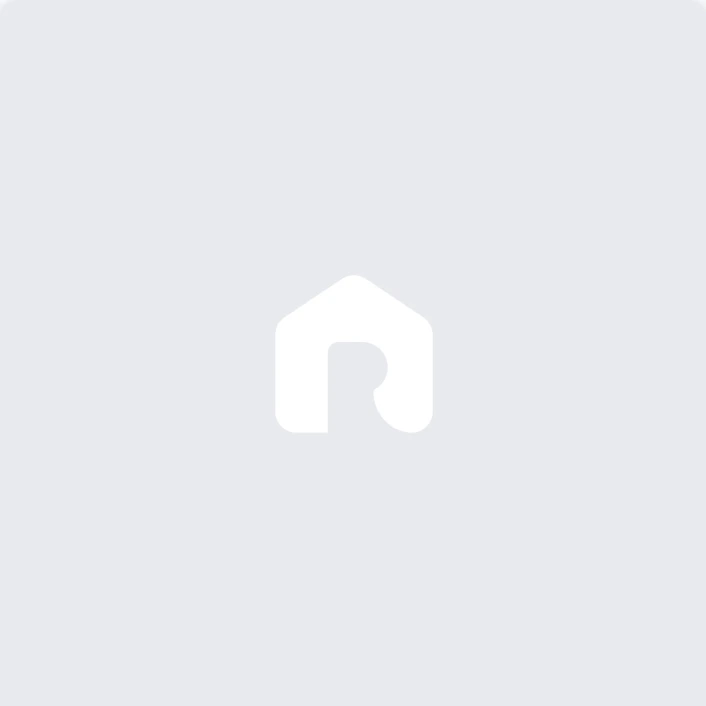

In [167]:
soup = BeautifulSoup(response.content)
soup

In [168]:
import pandas as pd
import numpy as np  # Import numpy for NaN values


City=[]
State_code=[]
Country=[]
Deposit=[]
Pets_allowed=[]
Area = []
no_of_Bathroom = []
no_of_Bedroom = []
Address = []
Rental_price = []
Washer_Dryer=[]
Air_conditioning=[]
Parking=[]
Fireplace=[]
Dishwasher=[]
Hardwood_Floors=[]
Roofdeck=[]
Storage=[]

# Scrape first 10 pages
for page_num in range(1, 46):
    page_url = f"{url}?page={page_num}"
    response = requests.get(page_url, headers=headers)
    soup = BeautifulSoup(response.content, 'html.parser')
    # Extract Address information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            City.append(item.text.replace('\n', '').strip())
    except:
        City.append(np.nan)  # Append NaN if data is missing
    # Extract state_code information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            State_code.append(item.text.replace('\n', '').strip())
    except:
        State_code.append(np.nan)  # Append NaN if data is missing
        # Extract Country information
    try:
        for item in soup.find_all('a', class_="property-card-bottom-address__text link-ghost font-xs one-line-string"):
            Country.append(item.text.replace('\n', '').strip())
    except:
        Country.append(np.nan)  # Append NaN if data is missing
          # Extract Deposit information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
           
            deposit=item.text.replace('\n', '').strip()
            Deposit.append (deposit)
            
    except:
        Deposit.append(np.nan)  # Append NaN if data is missing
          # Extract Pets_allowed information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Pets Allowed" in item.text:
                Pets_allowed.append("Yes")
            else:   
                Pets_allowed.append("No")
    except:
        Pets_allowed.append(np.nan)  # Append NaN if data is missing
         # Extract Area information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            area=item.text.replace('\n', '').strip()
            Area.append(area[2:])
    except:
        Area.append(np.nan)  # Append NaN if data is missing
         # Extract bathroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bathroom=item.text.replace('\n', '').strip()
            no_of_Bathroom.append(no_of_bathroom[1])
    except:
        no_of_Bathroom.append(np.nan)
    
    # Extract bedroom information
    try:
        for item in soup.find_all('div', class_="labels font-xs --short"):
            no_of_bedroom=item.text.replace('\n', '').strip()
            no_of_Bedroom.append(no_of_bedroom[0])
    except:
        no_of_Bedroom.append(np.nan)
     # Extract Adress information
    try:
        for item in soup.find_all('p', class_="property-card-info__second__item rb-icon-before rb-icon--location"):
            Address.append(item.text.replace('\n', '').strip())
    except:
        Address.append(np.nan)
    
    # Extract Rent information
    try:
        for item in soup.find_all('div', class_="property-card-bottom__main"):
            rental_price=item.text.replace('\n', '').strip()
            Rental_price.append(rental_price)
    except:
        Rental_price.append(np.nan)
   
          # Extract Washer/drier information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            #for soup.find_all('div', class_="labels__item ng-star-inserted") in item :
            if "Washer Dryer Combo" in item.text:
                    Washer_Dryer.append("Yes")
            else:   
                    Washer_Dryer.append("No")
    except:
        Washer_Dryer.append(np.nan)  # Append NaN if data is missing
     # Extract AC information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Air_conditioning" in item.text:
                Air_conditioning.append("Yes")
            else:   
                Air_conditioning.append("No")
    except:
        Air_conditioning.append(np.nan)  # Append NaN if data is missing
      # Extract Parking information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Parking" in item.text:
                Parking.append("Yes")
            else:   
                Parking.append("No")
    except:
        Parking.append(np.nan)  # Append NaN if data is missing
     # Extract Fireplace information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Fireplace" in item.text:
                Fireplace.append("Yes")
            else:   
                Fireplace.append("No")
    except:
        Fireplace.append(np.nan)  # Append NaN if data is missing
     # Extract Dishwasher information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Dishwasher" in item.text:
                Dishwasher.append("Yes")
            else:   
                Dishwasher.append("No")
    except:
        Dishwasher.append(np.nan)  # Append NaN if data is missing
 # Extract  Hardwood_floors information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Hardwood Floors"in item.text:
                Hardwood_Floors.append("Yes")
            else:   
                Hardwood_Floors.append("No")
    except:
         Hardwood_Floors.append(np.nan)  # Append NaN if data is missing
 # Extract  Roofdeck information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if  "Roofdeck" in item.text:
                Roofdeck.append("Yes")
            else:   
                Roofdeck.append("No")
    except:
         Roofdeck.append(np.nan)    # Append NaN if data is missing
# Extract  Storage information
    try:
        for item in soup.find_all('div', class_="labels font-xs"):
            if "Storage" in item.text:
                Storage.append("Yes")
            else:
                Storage.append("No")
                
    except:
         Storage.append(np.nan)  # Append NaN if data is missing
    


# Create DataFrame
munich = pd.DataFrame({
    'City': City[0:800],
    'State_code':State_code[0:800],
    'Country':Country[0:800],
    'Deposit': Deposit[0:800],
    'Pets_allowed':Pets_allowed[0:800],
    'Area': Area[0:800],
    'no_of_Bathroom': no_of_Bathroom[0:800],
    'no_of_Bedroom': no_of_Bedroom[0:800],
    'Address': Address[0:800],
    'Rental_price': Rental_price[0:800],
    'Washer_Dryer': Washer_Dryer[0:800],
    'Air_conditioning ': Air_conditioning[0:800],
    'Parking': Parking[0:800],
    'Fireplace': Fireplace[0:800],
    'Dishwasher': Dishwasher[0:800],
    'Hardwood_Floors': Hardwood_Floors[0:800],
    'Roofdeck': Roofdeck[0:800],
    'Storage': Storage[0:800]
   
})

# Display DataFrame
print(munich)

                                                  City  \
0    Leica Geosystems GmbH Vertrieb Deutschland, Tr...   
1        Deisenhofener Straße 4, 81539 Munich, Germany   
2                 Fallstraße 42, 81369 Munich, Germany   
3              Arnulfstraße 51a, 80636 Munich, Germany   
4               Frauenstraße 10, 80469 Munich, Germany   
..                                                 ...   
795           Alpspitzstraße 12, 81373 Munich, Germany   
796  Bischof-Adalbert-Straße 16, 80809 Munich, Germany   
797          Vogelweidestraße 3, 81677 Munich, Germany   
798             Watteaustraße 6, 81479 Munich, Germany   
799  Schechinger, Lindwurmstraße 60, 80337 Munich, ...   

                                            State_code  \
0    Leica Geosystems GmbH Vertrieb Deutschland, Tr...   
1        Deisenhofener Straße 4, 81539 Munich, Germany   
2                 Fallstraße 42, 81369 Munich, Germany   
3              Arnulfstraße 51a, 80636 Munich, Germany   
4            

In [171]:
munich.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Leica Geosystems GmbH Vertrieb Deutschland, Tr...","Leica Geosystems GmbH Vertrieb Deutschland, Tr...","€1,493",No,19 m2,1,1,"Leica Geosystems GmbH Vertrieb Deutschland, Tr...","€1,493",No,No,Yes,No,Yes,No,No,Yes,"Leica Geosystems GmbH Vertrieb Deutschland, Tr..."
1,1,"Deisenhofener Straße 4, 81539 Munich, Germany","Deisenhofener Straße 4, 81539 Munich, Germany",€845,No,12 m2,1,3,"Deisenhofener Straße 4, 81539 Munich, Germany",€845,No,No,No,No,No,No,No,No,"Deisenhofener Straße 4, 81539 Munich, Germany"
2,2,"Fallstraße 42, 81369 Munich, Germany","Fallstraße 42, 81369 Munich, Germany",€995,No,12 m2,1,4,"Fallstraße 42, 81369 Munich, Germany",€995,No,No,No,No,No,No,No,No,"Fallstraße 42, 81369 Munich, Germany"
3,3,"Arnulfstraße 51a, 80636 Munich, Germany","Arnulfstraße 51a, 80636 Munich, Germany","€3,298",No,udio127 m2,t,S,"Arnulfstraße 51a, 80636 Munich, Germany","€3,298",No,No,Yes,No,Yes,No,No,Yes,"Arnulfstraße 51a, 80636 Munich, Germany"
4,4,"Frauenstraße 10, 80469 Munich, Germany","Frauenstraße 10, 80469 Munich, Germany","€1,045",No,13 m2,1,3,"Frauenstraße 10, 80469 Munich, Germany","€1,045",No,No,No,No,No,No,No,No,"Frauenstraße 10, 80469 Munich, Germany"


In [170]:
munich=munich.assign(SNo=range(len(munich)))
titles=list(munich.columns)  
titles
titles[18],titles[0]=titles[0],titles[18]

munich=munich[titles]
munich.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,"Leica Geosystems GmbH Vertrieb Deutschland, Tr...","Leica Geosystems GmbH Vertrieb Deutschland, Tr...","€1,493",No,19 m2,1,1,"Leica Geosystems GmbH Vertrieb Deutschland, Tr...","€1,493",No,No,Yes,No,Yes,No,No,Yes,"Leica Geosystems GmbH Vertrieb Deutschland, Tr..."
1,1,"Deisenhofener Straße 4, 81539 Munich, Germany","Deisenhofener Straße 4, 81539 Munich, Germany",€845,No,12 m2,1,3,"Deisenhofener Straße 4, 81539 Munich, Germany",€845,No,No,No,No,No,No,No,No,"Deisenhofener Straße 4, 81539 Munich, Germany"
2,2,"Fallstraße 42, 81369 Munich, Germany","Fallstraße 42, 81369 Munich, Germany",€995,No,12 m2,1,4,"Fallstraße 42, 81369 Munich, Germany",€995,No,No,No,No,No,No,No,No,"Fallstraße 42, 81369 Munich, Germany"
3,3,"Arnulfstraße 51a, 80636 Munich, Germany","Arnulfstraße 51a, 80636 Munich, Germany","€3,298",No,udio127 m2,t,S,"Arnulfstraße 51a, 80636 Munich, Germany","€3,298",No,No,Yes,No,Yes,No,No,Yes,"Arnulfstraße 51a, 80636 Munich, Germany"
4,4,"Frauenstraße 10, 80469 Munich, Germany","Frauenstraße 10, 80469 Munich, Germany","€1,045",No,13 m2,1,3,"Frauenstraße 10, 80469 Munich, Germany","€1,045",No,No,No,No,No,No,No,No,"Frauenstraße 10, 80469 Munich, Germany"


Concating all 20 cities in 1 file

In [172]:
Real_estate=pd.concat([austin_tx, Buffalo_NY,dallas_tx,jersey_city,las_vegas,miami_fl,orlando_fl,ottawa_on,vancouver_bc,toronto_on,brisbane, 
             melbourne, sydney, tokyo, perth, amsterdam, birmingham, glasgow ,frankfurt, munich] , ignore_index=True)
              

In [173]:
Real_estate.tail()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
14901,795,"Alpspitzstraße 12, 81373 Munich, Germany","Alpspitzstraße 12, 81373 Munich, Germany","€1,500",No,33 m2,1,1,"Alpspitzstraße 12, 81373 Munich, Germany","€1,500",No,No,No,No,No,No,No,No,"Alpspitzstraße 12, 81373 Munich, Germany"
14902,796,"Bischof-Adalbert-Straße 16, 80809 Munich, Germany","Bischof-Adalbert-Straße 16, 80809 Munich, Germany","€2,200",No,,1,1,"Bischof-Adalbert-Straße 16, 80809 Munich, Germany","€2,200",No,No,No,No,No,No,No,No,"Bischof-Adalbert-Straße 16, 80809 Munich, Germany"
14903,797,"Vogelweidestraße 3, 81677 Munich, Germany","Vogelweidestraße 3, 81677 Munich, Germany","€2,100",No,52 m2,1,2,"Vogelweidestraße 3, 81677 Munich, Germany","€2,100",No,No,No,No,No,No,No,No,"Vogelweidestraße 3, 81677 Munich, Germany"
14904,798,"Watteaustraße 6, 81479 Munich, Germany","Watteaustraße 6, 81479 Munich, Germany","€1,000",No,,1,1,"Watteaustraße 6, 81479 Munich, Germany","€1,000",No,No,No,No,No,No,No,No,"Watteaustraße 6, 81479 Munich, Germany"
14905,799,"Schechinger, Lindwurmstraße 60, 80337 Munich, ...","Schechinger, Lindwurmstraße 60, 80337 Munich, ...","€3,500",No,90 m2,1,4,"Schechinger, Lindwurmstraße 60, 80337 Munich, ...","€3,500",No,No,No,No,No,No,No,No,"Schechinger, Lindwurmstraße 60, 80337 Munich, ..."


In [174]:
Real_estate=Real_estate.assign(SrNo=range(len(Real_estate)))

In [175]:
Real_estate.head()

,SNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,SrNo
0,0,801 West 5th Street,801 West 5th Street,"$3,380",No,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,0
1,1,1000 East 5th Street,1000 East 5th Street,"$2,012",No,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,1
2,2,110 San Antonio Street,110 San Antonio Street,"$3,754",No,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,2
3,3,615 West 7th Street,615 West 7th Street,"$3,922",No,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,3
4,4,"Austin, Jollyville, TX, US","Austin, Jollyville, TX, US","$1,118",No,630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,"Austin, Jollyville, TX, US",4


In [176]:
titles=list(Real_estate.columns)  
titles
titles[19],titles[0]=titles[0],titles[19]
Real_estate=Real_estate[titles]
Real_estate.head()

,SrNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,SNo
0,0,801 West 5th Street,801 West 5th Street,"$3,380",No,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,0
1,1,1000 East 5th Street,1000 East 5th Street,"$2,012",No,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,1
2,2,110 San Antonio Street,110 San Antonio Street,"$3,754",No,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,2
3,3,615 West 7th Street,615 West 7th Street,"$3,922",No,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,3
4,4,"Austin, Jollyville, TX, US","Austin, Jollyville, TX, US","$1,118",No,630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,"Austin, Jollyville, TX, US",4


In [177]:
Real_estate=Real_estate.drop(['SNo'], axis=1)

In [178]:
Real_estate.head()

,SrNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City
0,0,801 West 5th Street,801 West 5th Street,"$3,380",No,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street
1,1,1000 East 5th Street,1000 East 5th Street,"$2,012",No,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street
2,2,110 San Antonio Street,110 San Antonio Street,"$3,754",No,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street
3,3,615 West 7th Street,615 West 7th Street,"$3,922",No,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street
4,4,"Austin, Jollyville, TX, US","Austin, Jollyville, TX, US","$1,118",No,630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,"Austin, Jollyville, TX, US"


In [179]:
Real_estate[['City','State_Code','Country']]=Real_estate['Country'].str.split(',',n=2,expand=True)

In [180]:
Real_estate.head()

,SrNo,State_code,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
0,0,801 West 5th Street,None,"$3,380",No,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,None
1,1,1000 East 5th Street,None,"$2,012",No,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,None
2,2,110 San Antonio Street,None,"$3,754",No,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,None
3,3,615 West 7th Street,None,"$3,922",No,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,None
4,4,"Austin, Jollyville, TX, US","TX, US","$1,118",No,630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,Austin,Jollyville


In [181]:
Real_estate=Real_estate.drop(['State_code'], axis=1)

In [182]:
Real_estate.head()

,SrNo,Country,Deposit,Pets_allowed,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
0,0,None,"$3,380",No,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,None
1,1,None,"$2,012",No,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,None
2,2,None,"$3,754",No,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,None
3,3,None,"$3,922",No,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,None
4,4,"TX, US","$1,118",No,630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,Austin,Jollyville


In [183]:
titles=list(Real_estate.columns)  
titles
titles[1],titles[3]=titles[3],titles[1]
Real_estate=Real_estate[titles]
Real_estate.head()

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
0,0,No,"$3,380",None,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,None
1,1,No,"$2,012",None,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,None
2,2,No,"$3,754",None,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,None
3,3,No,"$3,922",None,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,None
4,4,No,"$1,118","TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,Austin,Jollyville


In [184]:
Real_estate1=Real_estate.copy()

In [185]:
Real_estate1

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
0,0,No,"$3,380",None,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,None
1,1,No,"$2,012",None,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,None
2,2,No,"$3,754",None,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,None
3,3,No,"$3,922",None,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,None
4,4,No,"$1,118","TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,Austin,Jollyville
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14901,14901,No,"€1,500",Germany,33 m2,1,1,"Alpspitzstraße 12, 81373 Munich, Germany","€1,500",No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich
14902,14902,No,"€2,200",Germany,,1,1,"Bischof-Adalbert-Straße 16, 80809 Munich, Germany","€2,200",No,No,No,No,No,No,No,No,Bischof-Adalbert-Straße 16,80809 Munich
14903,14903,No,"€2,100",Germany,52 m2,1,2,"Vogelweidestraße 3, 81677 Munich, Germany","€2,100",No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich
14904,14904,No,"€1,000",Germany,,1,1,"Watteaustraße 6, 81479 Munich, Germany","€1,000",No,No,No,No,No,No,No,No,Watteaustraße 6,81479 Munich


Converting all Currencies to INR 

In [186]:
d1 = {'1$':83.12, '1€':90.73,'1£':104.69,'1¥':0.56}
#first remove 1 with indexing
d = {k[1:]:v for k, v in d1.items()}
print (d)

{'$': 83.12, '€': 90.73, '£': 104.69, '¥': 0.56}


In [187]:
Real_estate1['Deposit']=Real_estate1['Deposit'].str.replace(',','')

In [188]:
  Real_estate1['Deposit'] = Real_estate1['Deposit'].str.replace(r'[A-Za-z]$', '')

<ipython-input-188-1ecd2d077ff1>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  Real_estate1['Deposit'] = Real_estate1['Deposit'].str.replace(r'[A-Za-z]$', '')


In [189]:
#map last value of column by dict and multiple all values without last
Real_estate1['Deposit'] = Real_estate1['Deposit'].str[0].map(d).mul(Real_estate1['Deposit'].str[1:].astype(int))

In [190]:
Real_estate1.head()

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
0,0,No,280945.60,None,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,None
1,1,No,167237.44,None,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,None
2,2,No,312032.48,None,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,None
3,3,No,325996.64,None,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,None
4,4,No,92928.16,"TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,Austin,Jollyville


In [191]:
Real_estate1['Deposit']=Real_estate1['Deposit'].round().astype(int)
Real_estate1['Deposit']

0        280946
1        167237
2        312032
3        325997
4         92928
          ...  
14901    136095
14902    199606
14903    190533
14904     90730
14905    317555
Name: Deposit, Length: 14906, dtype: int32

In [192]:
Real_estate1['Deposit']= "INR "+Real_estate1['Deposit'].astype(str) 
Real_estate1['Deposit']

0        INR 280946
1        INR 167237
2        INR 312032
3        INR 325997
4         INR 92928
            ...    
14901    INR 136095
14902    INR 199606
14903    INR 190533
14904     INR 90730
14905    INR 317555
Name: Deposit, Length: 14906, dtype: object

In [193]:
Real_estate1.head()

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
0,0,No,INR 280946,None,1400 Sq Ft,2,2,801 West 5th Street,"$3,380",No,No,No,No,No,No,No,No,801 West 5th Street,None
1,1,No,INR 167237,None,765 Sq Ft,1,1,1000 East 5th Street,"$2,012",No,No,No,No,No,No,No,No,1000 East 5th Street,None
2,2,No,INR 312032,None,1148 Sq Ft,2,2,110 San Antonio Street,"$3,754",No,No,No,No,No,No,No,No,110 San Antonio Street,None
3,3,No,INR 325997,None,1030 Sq Ft,2,2,615 West 7th Street,"$3,922",No,No,No,No,No,No,No,No,615 West 7th Street,None
4,4,No,INR 92928,"TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US","$1,118",No,No,No,No,No,No,No,No,Austin,Jollyville


In [194]:
Real_estate1['Rental_price']=Real_estate1['Rental_price'].str.replace(',','')
Real_estate1['Rental_price'] = Real_estate1['Rental_price'].str.replace(r'[A-Za-z]$', '')
#map last value of column by dict and multiple all values without last
Real_estate1['Rental_price'] = Real_estate1['Rental_price'].str[0].map(d).mul(Real_estate1['Rental_price'].str[1:].astype(int))
Real_estate1['Rental_price']=Real_estate1['Rental_price'].round().astype(int)
Real_estate1['Rental_price']= "INR "+Real_estate1['Rental_price'].astype(str) 
Real_estate1['Rental_price']

<ipython-input-194-a4087a6a3a03>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  Real_estate1['Rental_price'] = Real_estate1['Rental_price'].str.replace(r'[A-Za-z]$', '')


0        INR 280946
1        INR 167237
2        INR 312032
3        INR 325997
4         INR 92928
            ...    
14901    INR 136095
14902    INR 199606
14903    INR 190533
14904     INR 90730
14905    INR 317555
Name: Rental_price, Length: 14906, dtype: object

In [195]:
Real_estate1.loc[4500:4502]

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
4500,4500,No,INR 132826,None,400 Sq Ft,2,1,645 Northeast 77th Street,INR 132826,No,No,No,No,No,No,No,No,645 Northeast 77th Street,None
4501,4501,No,INR 426406,None,850 Sq Ft,2,1,"Miami, FL",INR 426406,No,No,No,No,Yes,No,No,No,Miami,FL
4502,4502,No,INR 1481198,None,1120 Sq Ft,2,2,"Miami, FL",INR 1481198,No,No,Yes,No,Yes,No,No,No,Miami,FL


In [196]:
Real_estate2=Real_estate1.copy()

In [199]:
blank_counts = Real_estate2['Rental_price'].eq('').sum()
blank_counts

0

In [200]:
Real_estate2_cleaned = Real_estate2.dropna(how='any')
Real_estate2_cleaned

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
4,4,No,INR 92928,"TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville
5,5,No,INR 67327,US,654 Sq Ft,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX
6,6,No,INR 265984,"TX 78741, USA",.51978 Sq Ft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin
7,7,No,INR 477940,"TX 78717, USA",.55079 Sq Ft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin
8,8,No,INR 124680,"TX 78757, USA",576 Sq Ft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14901,14901,No,INR 136095,Germany,33 m2,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich
14902,14902,No,INR 199606,Germany,,1,1,"Bischof-Adalbert-Straße 16, 80809 Munich, Germany",INR 199606,No,No,No,No,No,No,No,No,Bischof-Adalbert-Straße 16,80809 Munich
14903,14903,No,INR 190533,Germany,52 m2,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich
14904,14904,No,INR 90730,Germany,,1,1,"Watteaustraße 6, 81479 Munich, Germany",INR 90730,No,No,No,No,No,No,No,No,Watteaustraße 6,81479 Munich


In [201]:
Real_estate2_filtered = Real_estate2_cleaned[Real_estate2_cleaned['Area'].str.endswith(('m2', 'Sq Ft'))]
Real_estate2_filtered

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
4,4,No,INR 92928,"TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville
5,5,No,INR 67327,US,654 Sq Ft,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX
6,6,No,INR 265984,"TX 78741, USA",.51978 Sq Ft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin
7,7,No,INR 477940,"TX 78717, USA",.55079 Sq Ft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin
8,8,No,INR 124680,"TX 78757, USA",576 Sq Ft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,23 m2,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich
14900,14900,No,INR 115318,Germany,62 m2,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich
14901,14901,No,INR 136095,Germany,33 m2,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich
14903,14903,No,INR 190533,Germany,52 m2,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich


In [202]:
Real_estate2_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6281 entries, 4 to 14905
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   SrNo               6281 non-null   int32 
 1   Pets_allowed       6281 non-null   object
 2   Deposit            6281 non-null   object
 3   Country            6281 non-null   object
 4   Area               6281 non-null   object
 5   no_of_Bathroom     6281 non-null   object
 6   no_of_Bedroom      6281 non-null   object
 7   Address            6281 non-null   object
 8   Rental_price       6281 non-null   object
 9   Washer_Dryer       6281 non-null   object
 10  Air_conditioning   6281 non-null   object
 11  Parking            6281 non-null   object
 12  Fireplace          6281 non-null   object
 13  Dishwasher         6281 non-null   object
 14  Hardwood_Floors    6281 non-null   object
 15  Roofdeck           6281 non-null   object
 16  Storage            6281 non-null   object

In [203]:
Real_estate2_filtered['Area'] = Real_estate2_filtered['Area'].str.replace(r'^(udio)', '', regex=True)
Real_estate2_filtered

<ipython-input-203-870164e3e16f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Real_estate2_filtered['Area'] = Real_estate2_filtered['Area'].str.replace(r'^(udio)', '', regex=True)


,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
4,4,No,INR 92928,"TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville
5,5,No,INR 67327,US,654 Sq Ft,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX
6,6,No,INR 265984,"TX 78741, USA",.51978 Sq Ft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin
7,7,No,INR 477940,"TX 78717, USA",.55079 Sq Ft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin
8,8,No,INR 124680,"TX 78757, USA",576 Sq Ft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,23 m2,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich
14900,14900,No,INR 115318,Germany,62 m2,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich
14901,14901,No,INR 136095,Germany,33 m2,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich
14903,14903,No,INR 190533,Germany,52 m2,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich


In [204]:
Real_estate2_filtered['Area'] = Real_estate2_filtered['Area'].str.replace(r'\.5', '', regex=True)
Real_estate2_filtered['Area']

<ipython-input-204-3ecc4e82a0e9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Real_estate2_filtered['Area'] = Real_estate2_filtered['Area'].str.replace(r'\.5', '', regex=True)


4         630 Sq Ft
5         654 Sq Ft
6        1978 Sq Ft
7        5079 Sq Ft
8         576 Sq Ft
            ...    
14899         23 m2
14900         62 m2
14901         33 m2
14903         52 m2
14905         90 m2
Name: Area, Length: 6281, dtype: object

In [205]:
Real_estate2_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6281 entries, 4 to 14905
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   SrNo               6281 non-null   int32 
 1   Pets_allowed       6281 non-null   object
 2   Deposit            6281 non-null   object
 3   Country            6281 non-null   object
 4   Area               6281 non-null   object
 5   no_of_Bathroom     6281 non-null   object
 6   no_of_Bedroom      6281 non-null   object
 7   Address            6281 non-null   object
 8   Rental_price       6281 non-null   object
 9   Washer_Dryer       6281 non-null   object
 10  Air_conditioning   6281 non-null   object
 11  Parking            6281 non-null   object
 12  Fireplace          6281 non-null   object
 13  Dishwasher         6281 non-null   object
 14  Hardwood_Floors    6281 non-null   object
 15  Roofdeck           6281 non-null   object
 16  Storage            6281 non-null   object

In [206]:
Real_estate2_filtered['Area'].isnull().sum()

0

In [212]:
Real_estate2_filtered.tail(500)

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
14245,14245,No,INR 77120,Germany,9 m2,1,5,"Einsteinstraße 46, 81675 Munich, Germany",INR 77120,No,No,No,No,No,No,No,No,Einsteinstraße 46,81675 Munich
14247,14247,No,INR 90276,Germany,12 m2,1,3,"Adlzreiterstraße 13, 80337 Munich, Germany",INR 90276,No,No,No,No,No,No,No,No,Adlzreiterstraße 13,80337 Munich
14248,14248,No,INR 166490,"81739 Munich, Germany",120 m2,t,S,"Neuperlach Süd, Carl-Wery-Straße, 81739 Munich...",INR 166490,No,No,Yes,No,Yes,No,No,No,Neuperlach Süd,Carl-Wery-Straße
14250,14250,No,INR 239074,"81379 Munich, Germany",120 m2,t,S,"Ghostbike, Gmunder Straße, 81379 Munich, Germany",INR 239074,No,No,No,No,Yes,No,No,Yes,Ghostbike,Gmunder Straße
14251,14251,No,INR 138726,Germany,30 m2,1,2,"Ridlerstraße 19, 80339 Munich, Germany",INR 138726,No,No,No,No,Yes,No,No,No,Ridlerstraße 19,80339 Munich
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,23 m2,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich
14900,14900,No,INR 115318,Germany,62 m2,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich
14901,14901,No,INR 136095,Germany,33 m2,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich
14903,14903,No,INR 190533,Germany,52 m2,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich


In [209]:
Real_estate2_filtered.shape

(6281, 19)

In [213]:
Real_estate2_filtered['Area'].value_counts()

1000 Sq Ft    60
60 m2         55
150 m2        51
1400 Sq Ft    47
80 m2         45
              ..
547 Sq Ft      1
1545 Sq Ft     1
09 m2          1
754 Sq Ft      1
148 m2         1
Name: Area, Length: 2015, dtype: int64

In [ ]:
sd_1=Real_estate2_filtered['Area'].value_counts()
sd_1.to_csv('name5.csv')

In [214]:
Real_estate2_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6281 entries, 4 to 14905
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   SrNo               6281 non-null   int32 
 1   Pets_allowed       6281 non-null   object
 2   Deposit            6281 non-null   object
 3   Country            6281 non-null   object
 4   Area               6281 non-null   object
 5   no_of_Bathroom     6281 non-null   object
 6   no_of_Bedroom      6281 non-null   object
 7   Address            6281 non-null   object
 8   Rental_price       6281 non-null   object
 9   Washer_Dryer       6281 non-null   object
 10  Air_conditioning   6281 non-null   object
 11  Parking            6281 non-null   object
 12  Fireplace          6281 non-null   object
 13  Dishwasher         6281 non-null   object
 14  Hardwood_Floors    6281 non-null   object
 15  Roofdeck           6281 non-null   object
 16  Storage            6281 non-null   object

In [ ]:
Real_estate2_filtered['Area'].astype(float)

In [298]:
Real_estate2_filtered_4=Real_estate2_filtered.copy()
Real_estate2_filtered_4

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
4,4,No,INR 92928,"TX, US",630 Sq Ft,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville
5,5,No,INR 67327,US,654 Sq Ft,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX
6,6,No,INR 265984,"TX 78741, USA",1978 Sq Ft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin
7,7,No,INR 477940,"TX 78717, USA",5079 Sq Ft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin
8,8,No,INR 124680,"TX 78757, USA",576 Sq Ft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,23 m2,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich
14900,14900,No,INR 115318,Germany,62 m2,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich
14901,14901,No,INR 136095,Germany,33 m2,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich
14903,14903,No,INR 190533,Germany,52 m2,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich


In [299]:
Real_estate2_filtered_4[['Area','unit']]=Real_estate2_filtered_4['Area'].str.split(' ',n=1, expand=True)


In [300]:
Real_estate2_filtered_4.head()

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code,unit
4,4,No,INR 92928,"TX, US",630,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville,Sq Ft
5,5,No,INR 67327,US,654,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX,Sq Ft
6,6,No,INR 265984,"TX 78741, USA",1978,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin,Sq Ft
7,7,No,INR 477940,"TX 78717, USA",5079,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin,Sq Ft
8,8,No,INR 124680,"TX 78757, USA",576,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin,Sq Ft


In [341]:
#titles=list(Real_estate2_filtered_4.columns)  
#titles
#titles[4],titles[3]=titles[3],titles[4]
#Real_estate2_filtered_4=Real_estate2_filtered_4[titles]
Real_estate2_filtered_4.head()

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code,unit
4,4,No,INR 92928,"TX, US",630,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville,Sq Ft
5,5,No,INR 67327,US,654,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX,Sq Ft
6,6,No,INR 265984,"TX 78741, USA",1978,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin,Sq Ft
7,7,No,INR 477940,"TX 78717, USA",5079,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin,Sq Ft
8,8,No,INR 124680,"TX 78757, USA",576,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin,Sq Ft


In [314]:
Real_estate2_filtered_4_cleaned = Real_estate2_filtered_4.dropna(how='all')
Real_estate2_filtered_4_cleaned

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code,unit
4,4,No,INR 92928,"TX, US",630,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville,Sq Ft
5,5,No,INR 67327,US,654,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX,Sq Ft
6,6,No,INR 265984,"TX 78741, USA",1978,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin,Sq Ft
7,7,No,INR 477940,"TX 78717, USA",5079,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin,Sq Ft
8,8,No,INR 124680,"TX 78757, USA",576,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin,Sq Ft
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,23,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich,m2
14900,14900,No,INR 115318,Germany,62,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich,m2
14901,14901,No,INR 136095,Germany,33,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich,m2
14903,14903,No,INR 190533,Germany,52,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich,m2


In [315]:
Real_estate2_filtered_4_cleaned['Area'].str.contains('^0', regex=True)

4        False
5        False
6        False
7        False
8        False
         ...  
14899    False
14900    False
14901    False
14903    False
14905    False
Name: Area, Length: 6281, dtype: bool

In [316]:
Real_estate2_filtered_4_cleaned

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code,unit
4,4,No,INR 92928,"TX, US",630,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville,Sq Ft
5,5,No,INR 67327,US,654,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX,Sq Ft
6,6,No,INR 265984,"TX 78741, USA",1978,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin,Sq Ft
7,7,No,INR 477940,"TX 78717, USA",5079,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin,Sq Ft
8,8,No,INR 124680,"TX 78757, USA",576,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin,Sq Ft
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,23,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich,m2
14900,14900,No,INR 115318,Germany,62,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich,m2
14901,14901,No,INR 136095,Germany,33,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich,m2
14903,14903,No,INR 190533,Germany,52,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich,m2


In [317]:
Real_estate2_filtered_4_cleaned['Area']=Real_estate2_filtered_4_cleaned['Area'].replace('', np.nan)
Real_estate2_filtered_4_cleaned['Area']

4         630
5         654
6        1978
7        5079
8         576
         ... 
14899      23
14900      62
14901      33
14903      52
14905      90
Name: Area, Length: 6281, dtype: object

In [318]:
Real_estate2_filtered_4_cleaned.dropna(subset=['Area'], inplace=True)

In [319]:
Real_estate2_filtered_4_cleaned['Area']=Real_estate2_filtered_4_cleaned['Area'].astype(float)

In [320]:
Real_estate2_filtered_4_cleaned['Area']=Real_estate2_filtered_4_cleaned['Area'].round().astype(int)

In [321]:
Real_estate2_filtered_4_cleaned.loc[Real_estate2_filtered_4_cleaned['unit'] == 'm2', 'Area'] *= 10.76

In [322]:
Real_estate2_filtered_4_cleaned

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code,unit
4,4,No,INR 92928,"TX, US",630.00,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville,Sq Ft
5,5,No,INR 67327,US,654.00,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX,Sq Ft
6,6,No,INR 265984,"TX 78741, USA",1978.00,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin,Sq Ft
7,7,No,INR 477940,"TX 78717, USA",5079.00,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin,Sq Ft
8,8,No,INR 124680,"TX 78757, USA",576.00,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin,Sq Ft
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,247.48,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich,m2
14900,14900,No,INR 115318,Germany,667.12,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich,m2
14901,14901,No,INR 136095,Germany,355.08,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich,m2
14903,14903,No,INR 190533,Germany,559.52,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich,m2


In [323]:
Real_estate2_filtered_4_cleaned['Area']=Real_estate2_filtered_4_cleaned['Area'].round().astype(int)

In [324]:
Real_estate2_filtered_4_cleaned['Area']=Real_estate2_filtered_4_cleaned['Area'].astype(str) + ' Sqft'

In [325]:
Real_estate2_filtered_4_cleaned

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code,unit
4,4,No,INR 92928,"TX, US",630 Sqft,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville,Sq Ft
5,5,No,INR 67327,US,654 Sqft,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX,Sq Ft
6,6,No,INR 265984,"TX 78741, USA",1978 Sqft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin,Sq Ft
7,7,No,INR 477940,"TX 78717, USA",5079 Sqft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin,Sq Ft
8,8,No,INR 124680,"TX 78757, USA",576 Sqft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin,Sq Ft
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,247 Sqft,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich,m2
14900,14900,No,INR 115318,Germany,667 Sqft,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich,m2
14901,14901,No,INR 136095,Germany,355 Sqft,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich,m2
14903,14903,No,INR 190533,Germany,560 Sqft,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich,m2


In [327]:
Real_estate2_filtered_4_cleaned.drop('unit',axis=1,inplace=True)

In [329]:
Real_estate2_filtered_4_cleaned

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
4,4,No,INR 92928,"TX, US",630 Sqft,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville
5,5,No,INR 67327,US,654 Sqft,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX
6,6,No,INR 265984,"TX 78741, USA",1978 Sqft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin
7,7,No,INR 477940,"TX 78717, USA",5079 Sqft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin
8,8,No,INR 124680,"TX 78757, USA",576 Sqft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14899,14899,No,INR 131468,Germany,247 Sqft,1,1,"Fromundstraße 45, 81547 Munich, Germany",INR 131468,No,No,No,No,No,No,No,No,Fromundstraße 45,81547 Munich
14900,14900,No,INR 115318,Germany,667 Sqft,1,2,"Ingeborgstraße 46, 81825 Munich, Germany",INR 115318,No,No,No,No,No,No,No,No,Ingeborgstraße 46,81825 Munich
14901,14901,No,INR 136095,Germany,355 Sqft,1,1,"Alpspitzstraße 12, 81373 Munich, Germany",INR 136095,No,No,No,No,No,No,No,No,Alpspitzstraße 12,81373 Munich
14903,14903,No,INR 190533,Germany,560 Sqft,1,2,"Vogelweidestraße 3, 81677 Munich, Germany",INR 190533,No,No,No,No,No,No,No,No,Vogelweidestraße 3,81677 Munich


In [330]:
Real_estate2_filtered_4_cleaned.reset_index(drop=True, inplace=True)

In [332]:
Real_estate2_filtered_4_cleaned.head(50)

,SrNo,Pets_allowed,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,Washer_Dryer,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,City,State_Code
0,4,No,INR 92928,"TX, US",630 Sqft,1,1,"Austin, Jollyville, TX, US",INR 92928,No,No,No,No,No,No,No,No,Austin,Jollyville
1,5,No,INR 67327,US,654 Sqft,1,1,"Austin, TX, US",INR 67327,No,No,No,No,No,No,No,No,Austin,TX
2,6,No,INR 265984,"TX 78741, USA",1978 Sqft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,No,No,No,No,No,No,No,No,1513 Arcilla Street,Austin
3,7,No,INR 477940,"TX 78717, USA",5079 Sqft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,No,No,No,No,No,No,No,No,9979 Lavon Bend,Austin
4,8,No,INR 124680,"TX 78757, USA",576 Sqft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,No,No,No,No,No,No,No,No,7685 Northcross Drive,Austin
5,10,No,INR 191176,"TX 78724, USA",2101 Sqft,2,3,"7633 Rio Pass, Austin, TX 78724, USA",INR 191176,No,No,No,No,No,No,No,No,7633 Rio Pass,Austin
6,11,No,INR 199488,"TX 78748, USA",1918 Sqft,2,3,"1598 Catalan Road, Austin, TX 78748, USA",INR 199488,No,No,No,No,No,No,No,No,1598 Catalan Road,Austin
7,12,No,INR 153772,"TX 78705, USA",0 Sqft,1,2,"910 Duncan Lane, Austin, TX 78705, USA",INR 153772,No,No,No,No,No,No,No,No,910 Duncan Lane,Austin
8,13,No,INR 224008,"TX 78721, USA",1465 Sqft,2,3,"5410 Downs Drive, Austin, TX 78721, USA",INR 224008,No,No,No,No,No,No,No,No,5410 Downs Drive,Austin
9,14,No,INR 199488,"TX 78741, USA",1652 Sqft,2,5,"6008 Club Terrace, Austin, TX 78741, USA",INR 199488,No,No,No,No,No,No,No,No,6008 Club Terrace,Austin


In [333]:
Real_estate2_filtered_4_cleaned=Real_estate2_filtered_4_cleaned.assign(SrNo=range(len(Real_estate2_filtered_4_cleaned)))

In [347]:
Real_estate2_filtered_4_cleaned.head()

,SrNo,State_Code,Deposit,Country,Area,no_of_Bathroom,no_of_Bedroom,Address,Rental_price,City,Air_conditioning,Parking,Fireplace,Dishwasher,Hardwood_Floors,Roofdeck,Storage,Washer_Dryer,Pets_allowed
0,0,Jollyville,INR 92928,"TX, US",630 Sqft,1,1,"Austin, Jollyville, TX, US",INR 92928,Austin,No,No,No,No,No,No,No,No,No
1,1,TX,INR 67327,US,654 Sqft,1,1,"Austin, TX, US",INR 67327,Austin,No,No,No,No,No,No,No,No,No
2,2,Austin,INR 265984,"TX 78741, USA",1978 Sqft,2,3,"1513 Arcilla Street, Austin, TX 78741, USA",INR 265984,1513 Arcilla Street,No,No,No,No,No,No,No,No,No
3,3,Austin,INR 477940,"TX 78717, USA",5079 Sqft,4,5,"9979 Lavon Bend, Austin, TX 78717, USA",INR 477940,9979 Lavon Bend,No,No,No,No,No,No,No,No,No
4,4,Austin,INR 124680,"TX 78757, USA",576 Sqft,1,1,"7685 Northcross Drive, Austin, TX 78757, USA",INR 124680,7685 Northcross Drive,No,No,No,No,No,No,No,No,No


In [338]:
titles=list(Real_estate2_filtered_4_cleaned.columns)  
titles
titles[17],titles[9]=titles[9],titles[17]
Real_estate2_filtered_4_cleaned=Real_estate2_filtered_4_cleaned[titles]

In [348]:
Real_estate_final_data=Real_estate2_filtered_4_cleaned

In [349]:
Real_estate_final_data.shape

(6278, 19)

In [351]:
sd_2=Real_estate_final_data
sd_2.to_csv('Real_estate_final_data.csv')